##Loading and executing the notebook

In [0]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import time
!pip install umap-learn
import umap
from mpl_toolkits.mplot3d import Axes3D


# We want to use the latest version of Seaborn (0.9.0) but an older version is
# installed on Colab. Run this cell only once to install the right version.
!pip install seaborn==0.9.0
import seaborn as sns
sns.set(style="white", font_scale=1.5)

# URL for the 2018 Table 
url = 'https://raw.githubusercontent.com/abhishek-verma-26/Datasets/master/PalmTraits_1p0_v2.csv'
palmtraits_df = pd.read_csv(url)

     |████████████████████████████████| 215kB 2.8MB/s 
  Found existing installation: seaborn 0.10.0
    Uninstalling seaborn-0.10.0:
      Successfully uninstalled seaborn-0.10.0


#Introduction


---

Plam tree are an important plant group contributing to the bio diversity and to the global economy, in general, by providing raw materials for food, oil, fuel etc. Based on the region, climate and ecosystem a variety of palm tree species can be grow globally. Knowing the physical triats and the taxonomy of each species can help evaluate the interrelationships between species belongs to a different taxonomical group like Palm Subfamily or Plam Tribe.


The dataset used for this excercise is based on the derived measurement of over 2500 species of palm tree. As cited from https://www.nature.com/articles/s41597-019-0189-0#Tab1 , the dataset contains the global species compilation of functional traits of palm tree (Arecaceae) which predominantly grows in tropical and subtropical ecosystem



Features in this dataset can be divided into six main categories :
1. **Taxonomy**: 
  'SpecName', 'accGenus', 'accSpecies', 'PalmTribe', 'PalmSubfamily'
2. **Growth Form and Habit**: 
'Climbing', 'Acaulescent', 'Erect', 'StemSolitary'
3. **Armature**: 'StemArmed', 'LeavesArmed'
4. **Stem Size**: 'MaxStemHeight_m', 'MaxStemDia_cm', 'UnderstoreyCanopy'
5. **Leaf Properties**: 'MaxLeafNumber', 'Max_Blade_Length_m', 'Max_Rachis_Length_m', 'Max_Petiole_length_m'
6. **Fruit Properties**: 'AverageFruitLength_cm', 'MinFruitLength_cm', 'MaxFruitLength_cm', 'AverageFruitWidth_cm','MinFruitWidth_cm', 'MaxFruitWidth_cm', 'FruitSizeCategorical',       'FruitShape', 'FruitColorDescription', 'MainFruitColors','Conspicuousness'

The taxonomy columns describes the genus and species classification of the plant


**Objective**

In this excercise we will attempt to form clusters unsupervised based on the palm tree traits and cross reference it with the taxonomy labels.
We test the hypothesis that the clustering based on plants traits or physical properties is in agreement with the taxonomical group. 



In [0]:
palmtraits_df

,SpecName,accGenus,accSpecies,PalmTribe,PalmSubfamily,Climbing,Acaulescent,Erect,StemSolitary,StemArmed,LeavesArmed,MaxStemHeight_m,MaxStemDia_cm,UnderstoreyCanopy,MaxLeafNumber,Max_Blade_Length_m,Max_Rachis_Length_m,Max_Petiole_length_m,AverageFruitLength_cm,MinFruitLength_cm,MaxFruitLength_cm,AverageFruitWidth_cm,MinFruitWidth_cm,MaxFruitWidth_cm,FruitSizeCategorical,FruitShape,FruitColorDescription,MainFruitColors,Conspicuousness
0,Acanthophoenix crinita,Acanthophoenix,crinita,Areceae,Arecoideae,0,0,1,1.0,1.0,1.0,10.0,20.0,canopy,15.0,2.30,NaN,NaN,0.65,0.6,0.7,0.50,NaN,NaN,small,NaN,black,black,cryptic
1,Acanthophoenix rousselii,Acanthophoenix,rousselii,Areceae,Arecoideae,0,0,1,1.0,1.0,1.0,25.0,30.0,canopy,NaN,3.00,NaN,NaN,2.00,NaN,NaN,0.80,NaN,NaN,small,ovoid,black,black,cryptic
2,Acanthophoenix rubra,Acanthophoenix,rubra,Areceae,Arecoideae,0,0,1,1.0,1.0,1.0,15.0,18.0,canopy,20.0,3.10,3.0,NaN,1.00,NaN,NaN,0.70,NaN,NaN,small,ovoid,black,black,cryptic
3,Acoelorrhaphe wrightii,Acoelorrhaphe,wrightii,Trachycarpeae,Coryphoideae,0,0,1,0.0,0.0,1.0,9.1,15.0,canopy,25.0,1.30,0.7,0.65,0.70,NaN,NaN,0.70,0.5,0.9,small,ovoid,orange-brown; becomming black,brown; black,cryptic
4,Acrocomia aculeata,Acrocomia,aculeata,Cocoseae,Arecoideae,0,0,1,1.0,1.0,1.0,12.0,50.0,canopy,30.0,3.50,2.5,NaN,4.25,3.5,5.0,4.60,3.8,5.4,large,ovoid,yellowish green,green,cryptic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2552,Wettinia quinaria,Wettinia,quinaria,Irarteeae,Arecoideae,0,0,1,1.0,0.0,0.0,15.0,20.0,canopy,6.0,5.50,3.2,1.35,2.75,2.0,3.5,2.00,1.5,2.5,small,ovoid,dark brown; green,brown; green,cryptic
2553,Wettinia radiata,Wettinia,radiata,Irarteeae,Arecoideae,0,0,1,1.0,0.0,0.0,9.0,10.0,canopy,6.0,4.33,3.4,NaN,4.00,3.0,4.0,2.00,NaN,NaN,large,globose,yellow,yellow,conspicuous
2554,Wettinia verruculosa,Wettinia,verruculosa,Irarteeae,Arecoideae,0,0,1,1.0,0.0,0.0,10.0,20.0,canopy,6.0,6.00,3.7,2.40,2.50,NaN,NaN,1.50,NaN,NaN,small,ovoid,green to brown; green,green; brown,cryptic
2555,Wodyetia bifurcata,Wodyetia,bifurcata,Areceae,Arecoideae,0,0,1,1.0,0.0,0.0,15.0,25.0,canopy,10.0,3.20,2.3,1.02,5.75,5.0,6.5,4.35,2.7,6.0,large,globose,red,red,conspicuous


The feature were sampled from multiple available sources and harmonized. However, some features are sparse. Forexample, leaf traits such as MaxLeafNumber, Max_Rachis_Length_m, Max_petiole_length_m have above 40% null values.

In [0]:
# Null Values from the original Palm Tree Dataset
print ('\033[1m'+ "Null Value Statistics of Raw Dataset")
null_percent = 100*palmtraits_df.isnull().sum()/palmtraits_df.isnull().count()
null_percent

Null Value Statistics of Raw Dataset


SpecName                  0.000000
accGenus                  0.000000
accSpecies                0.000000
PalmTribe                 0.000000
PalmSubfamily             0.000000
Climbing                  0.000000
Acaulescent               0.000000
Erect                     0.000000
StemSolitary             14.665624
StemArmed                 2.150958
LeavesArmed               4.693000
MaxStemHeight_m          17.442315
MaxStemDia_cm            23.543215
UnderstoreyCanopy        10.363707
MaxLeafNumber            48.924521
Max_Blade_Length_m       25.772390
Max_Rachis_Length_m      40.125147
Max_Petiole_length_m     52.678921
AverageFruitLength_cm    19.749707
MinFruitLength_cm        64.567853
MaxFruitLength_cm        64.176770
AverageFruitWidth_cm     22.017990
MinFruitWidth_cm         61.126320
MaxFruitWidth_cm         60.813453
FruitSizeCategorical     19.749707
FruitShape               29.917873
FruitColorDescription    27.727806
MainFruitColors          29.644114
Conspicuousness     

The data trait information is specific to the genus/species of plam tree. Hence a strong inferential modelling is needed to fill in the empty trait values. For the purpose of this study we mostly concentrate on the unsupervised aspect of machine learning by avoiding records with any missing traits.

We trim the dataset based on two aspect:
1. Keep feature with null values less than 25% of total record of 2557
2. Remove any record with null features

The trimmed datasets reduces to 12 physical trait features with 1647 (upto 35% reduction). The types of features are:
1. Binary Features: 6 
2. Continuous Features: 4
3. Categorical Features: 2 

We later arrange the categorical features as dummy varible in the input.

We use this trimmed version to run our unsupervised learning models. 

In [0]:
# Choosing features with less than 25% empty traits
palmtraits_fix_df = palmtraits_df.copy()
palmtraits_fix_df = palmtraits_fix_df.drop(list(null_percent[(null_percent > 25).values].index),axis=1)

# Discard record any any missing values
palmtraits_fix_df = palmtraits_fix_df.dropna()

# Null Values after discard columna with greater than 25% null values
print ('\033[1m'+ "Null Value Statistics of Trimmed dataset")
null_percent2 = 100*palmtraits_fix_df.isnull().sum()/palmtraits_fix_df.isnull().count()
null_percent2

Null Value Statistics of Trimmed dataset


SpecName                 0.0
accGenus                 0.0
accSpecies               0.0
PalmTribe                0.0
PalmSubfamily            0.0
Climbing                 0.0
Acaulescent              0.0
Erect                    0.0
StemSolitary             0.0
StemArmed                0.0
LeavesArmed              0.0
MaxStemHeight_m          0.0
MaxStemDia_cm            0.0
UnderstoreyCanopy        0.0
AverageFruitLength_cm    0.0
AverageFruitWidth_cm     0.0
FruitSizeCategorical     0.0
dtype: float64

In [0]:
palmtraits_fix_df

,SpecName,accGenus,accSpecies,PalmTribe,PalmSubfamily,Climbing,Acaulescent,Erect,StemSolitary,StemArmed,LeavesArmed,MaxStemHeight_m,MaxStemDia_cm,UnderstoreyCanopy,AverageFruitLength_cm,AverageFruitWidth_cm,FruitSizeCategorical
0,Acanthophoenix crinita,Acanthophoenix,crinita,Areceae,Arecoideae,0,0,1,1.0,1.0,1.0,10.0,20.0,canopy,0.65,0.50,small
1,Acanthophoenix rousselii,Acanthophoenix,rousselii,Areceae,Arecoideae,0,0,1,1.0,1.0,1.0,25.0,30.0,canopy,2.00,0.80,small
2,Acanthophoenix rubra,Acanthophoenix,rubra,Areceae,Arecoideae,0,0,1,1.0,1.0,1.0,15.0,18.0,canopy,1.00,0.70,small
3,Acoelorrhaphe wrightii,Acoelorrhaphe,wrightii,Trachycarpeae,Coryphoideae,0,0,1,0.0,0.0,1.0,9.1,15.0,canopy,0.70,0.70,small
4,Acrocomia aculeata,Acrocomia,aculeata,Cocoseae,Arecoideae,0,0,1,1.0,1.0,1.0,12.0,50.0,canopy,4.25,4.60,large
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2552,Wettinia quinaria,Wettinia,quinaria,Irarteeae,Arecoideae,0,0,1,1.0,0.0,0.0,15.0,20.0,canopy,2.75,2.00,small
2553,Wettinia radiata,Wettinia,radiata,Irarteeae,Arecoideae,0,0,1,1.0,0.0,0.0,9.0,10.0,canopy,4.00,2.00,large
2554,Wettinia verruculosa,Wettinia,verruculosa,Irarteeae,Arecoideae,0,0,1,1.0,0.0,0.0,10.0,20.0,canopy,2.50,1.50,small
2555,Wodyetia bifurcata,Wodyetia,bifurcata,Areceae,Arecoideae,0,0,1,1.0,0.0,0.0,15.0,25.0,canopy,5.75,4.35,large


# Exploratory Data Analysis (EDA) and Data Wrangling


---


## Target Feature: Palm Subfamily
This excercise is an unsupervised learning task and most of our prediction will be made based on the input features alone. But with the Taxonomy, we can evaluate the performance of our modelling (ARI score) and the taxonomical distribution within each modelled cluster.

From the trimmed dataset, we observe that distribution is skewed. More than 58% of the datapoint belong to 'Arecoideae' type. The remaining three account for 22%, 18% and 2% respectively.
Interestingly there is only one record for 'Nypoideae' subfamily which mostly likely would not be accounted as a cluster.

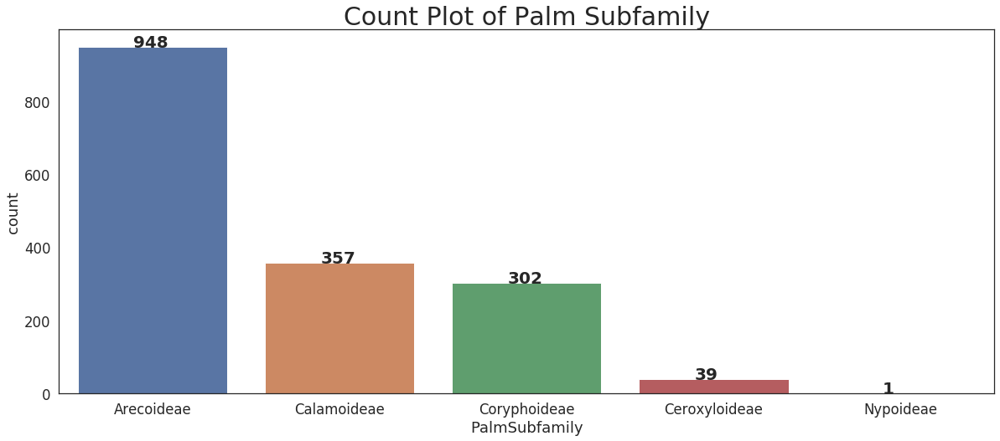

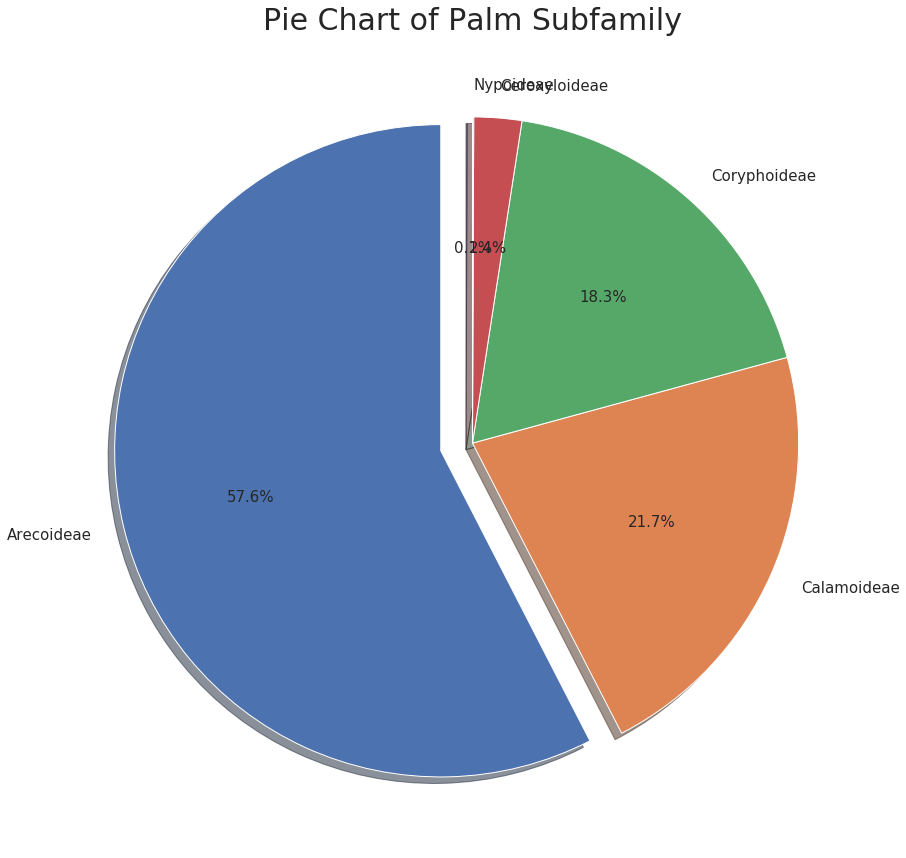

In [0]:
# EDA on Clustering Target "Palm Tribe"
fig = plt.figure(figsize=(20,8))
sns.countplot(x="PalmSubfamily",order = palmtraits_fix_df['PalmSubfamily'].value_counts().index, data=palmtraits_fix_df)
plt.title('Count Plot of Palm Subfamily', fontsize = 30)
cnt = 0
for val in palmtraits_fix_df['PalmSubfamily'].value_counts(): 
  plt.text(-0.1+cnt*1, val, str(val),fontdict={'weight': 'bold', 'size': 20})
  cnt += 1
plt.show()

fig = plt.figure(figsize=(15,15))
explode = (0.1, 0, 0, 0,0) 
count = palmtraits_fix_df['PalmSubfamily'].value_counts()
labels = palmtraits_fix_df['PalmSubfamily'].value_counts().index
ax = plt.pie(count, labels=labels,explode = explode,shadow=True, autopct='%1.1f%%',startangle=90,radius=  1,textprops={'size': 'small'})
plt.title('Pie Chart of Palm Subfamily', fontsize = 30)
plt.show()

## Target Feature: Palm Tribe

Each palm subfamily can be further divided into various palm tribes. In total there are 28 plams tribes with Arecoideae and Coryphoideae subfamilies having 13 and 8 groups each.

The datapoint distribution among Palm Tribes is also highly skewed with first six families capturing almost 82% of data variance.

In [0]:
uniq = palmtraits_fix_df['PalmSubfamily'].unique()
for val in uniq:
  cond = palmtraits_fix_df['PalmSubfamily'] == val
  print ("Number of Palm tribes in Subfamily {} : {}".format(val,palmtraits_fix_df[cond]['PalmTribe'].nunique()) )

Number of Palm tribes in Subfamily Arecoideae : 13
Number of Palm tribes in Subfamily Coryphoideae : 8
Number of Palm tribes in Subfamily Ceroxyloideae : 3
Number of Palm tribes in Subfamily Calamoideae : 3
Number of Palm tribes in Subfamily Nypoideae : 1


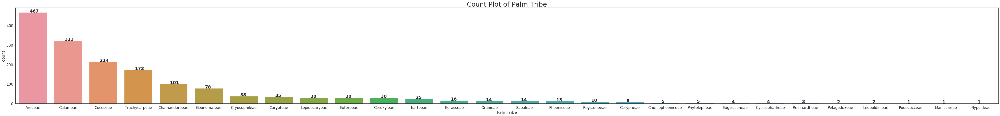

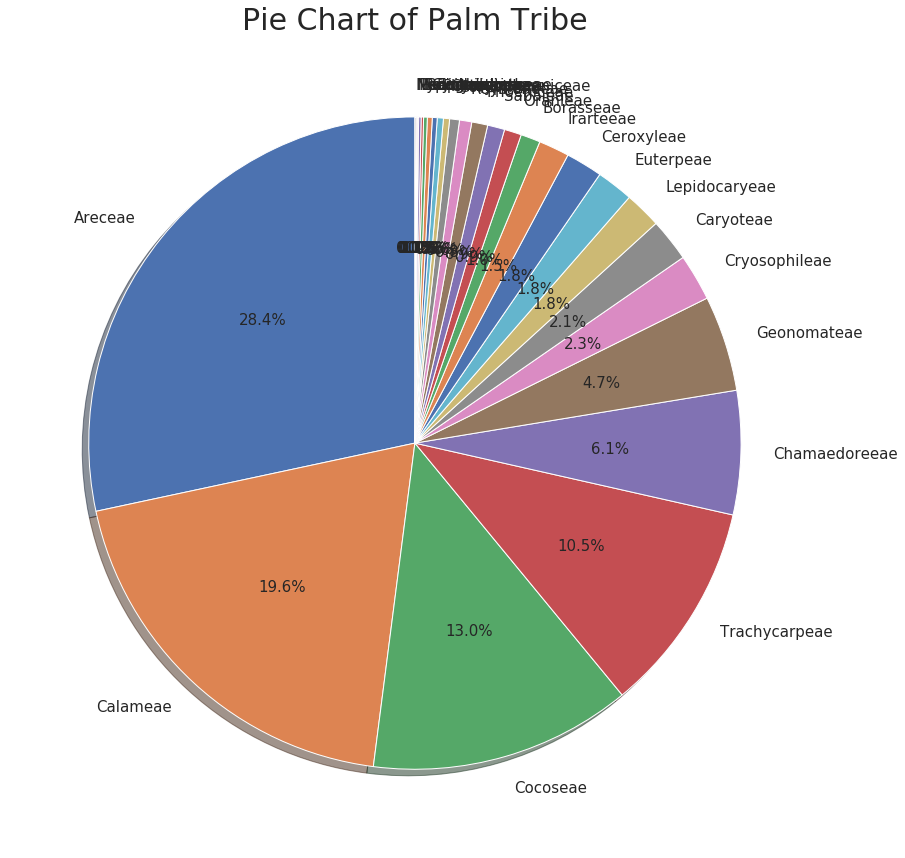

In [0]:
# EDA on Clustering Target "Palm Tribe"
fig = plt.figure(figsize=(80,8))
sns.countplot(x="PalmTribe", order=palmtraits_fix_df['PalmTribe'].value_counts().index,data=palmtraits_fix_df)
cnt = 0
for val in palmtraits_fix_df['PalmTribe'].value_counts(): 
  plt.text(-0.1+cnt*1, val, str(val),fontdict={'weight': 'bold', 'size': 20})
  cnt += 1
plt.title('Count Plot of Palm Tribe', fontsize = 30)
plt.show()

fig = plt.figure(figsize=(15,15)) 
count = palmtraits_fix_df['PalmTribe'].value_counts()
labels = palmtraits_fix_df['PalmTribe'].value_counts().index
ax = plt.pie(count, labels=labels,shadow=True, autopct='%1.1f%%',startangle=90,radius=  1,textprops={'size': 'smaller'})
plt.title('Pie Chart of Palm Tribe', fontsize = 30)
plt.show()

## Input Features:  Binary and Categorical Types

As shown earlier in total we have 6 binary type and 2 categorical type features describing the palm traits. The binary features descibes the 'Growth Form' and 'Armature' traits. The categorical features describe the 'Stem Size' and 'Fruit' Traits.

Visually we find almost all features are unevenly distributed with some outliers or smaller count values.

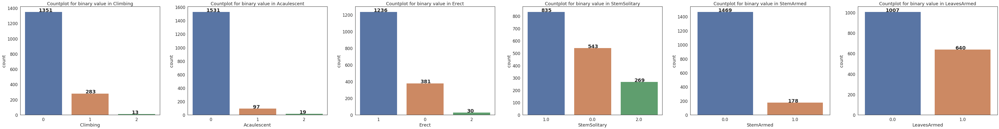

In [0]:
# Binary Variable
binary_col = palmtraits_fix_df.columns[5:11]

# Plotting categorical plot after filling missing nan values
plt.figure(figsize=(70,8))
cnt = 0
for col in binary_col:
  cnt += 1
  plt.subplot(1, 6, cnt)
  sns.countplot(x = col,order = palmtraits_fix_df[col].value_counts().index,data = palmtraits_fix_df)
  cnt2 = 0
  for val in palmtraits_fix_df[col].value_counts(): 
    plt.text(-0.1+cnt2*1, val, str(val),fontdict={'weight': 'bold', 'size': 20})
    cnt2 += 1
  plt.title("Countplot for binary value in "+col)
plt.show()

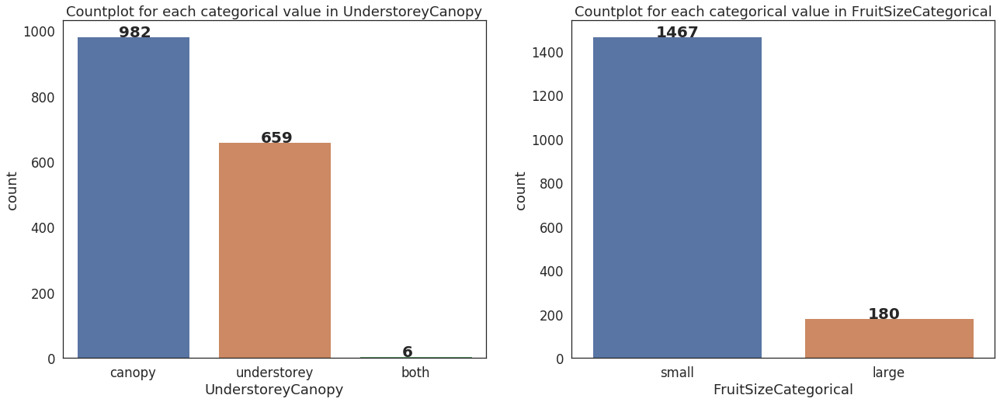

In [0]:
# Categorical Variable
cat_col = ['UnderstoreyCanopy','FruitSizeCategorical']

  # Plotting categorical plot after filling missing nan values
plt.figure(figsize=(45,8))
cnt = 0
for col in cat_col:
  cnt += 1
  plt.subplot(1, 4, cnt)
  sns.countplot(x = col, data = palmtraits_fix_df)
  cnt2 = 0
  for val in palmtraits_fix_df[col].value_counts(): 
    plt.text(-0.1+cnt2*1, val, str(val),fontdict={'weight': 'bold', 'size': 20})
    cnt2 += 1
  plt.title("Countplot for each categorical value in "+col)
plt.show()

## Input Features:  Continuous Types

In total 4 continuous features are present, describing the 'Stem' and 'Fruit' Traits of the palm species. The distribution is highly asymmetric

> Indented block





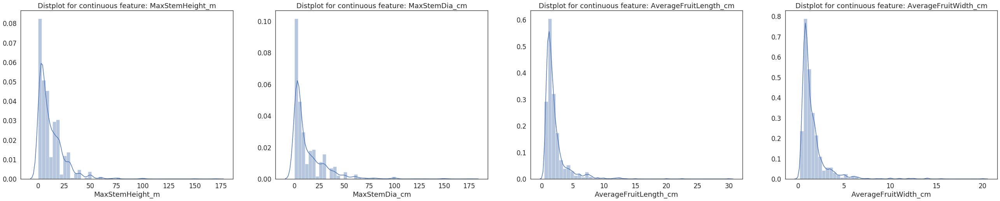

In [0]:
# Continuous Variable
cont_col = ['MaxStemHeight_m','MaxStemDia_cm','AverageFruitLength_cm','AverageFruitWidth_cm']

# Plotting distribution plot
plt.figure(figsize=(45,8))
cnt = 0
for col in cont_col:
  cnt += 1
  plt.subplot(1, 4, cnt)
  sns.distplot(palmtraits_fix_df[col])
  plt.title("Distplot for continuous feature: "+col)
plt.show()

# Bivarate Analysis:  Continuous Features

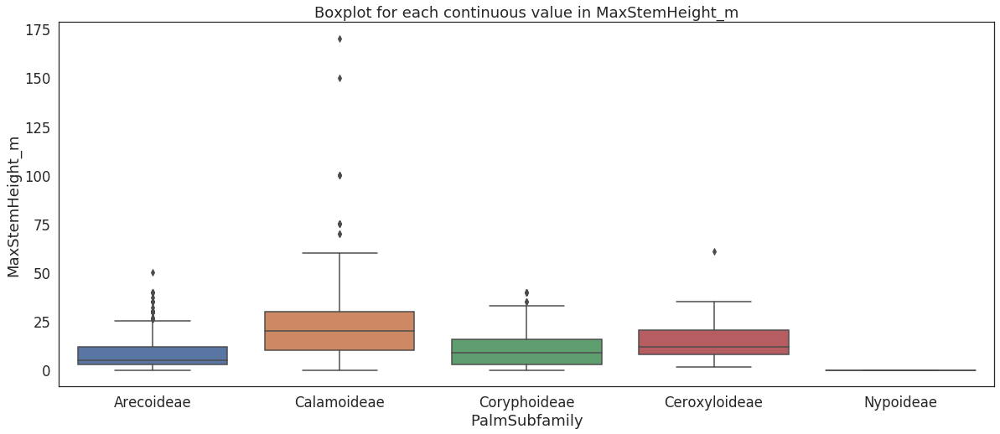

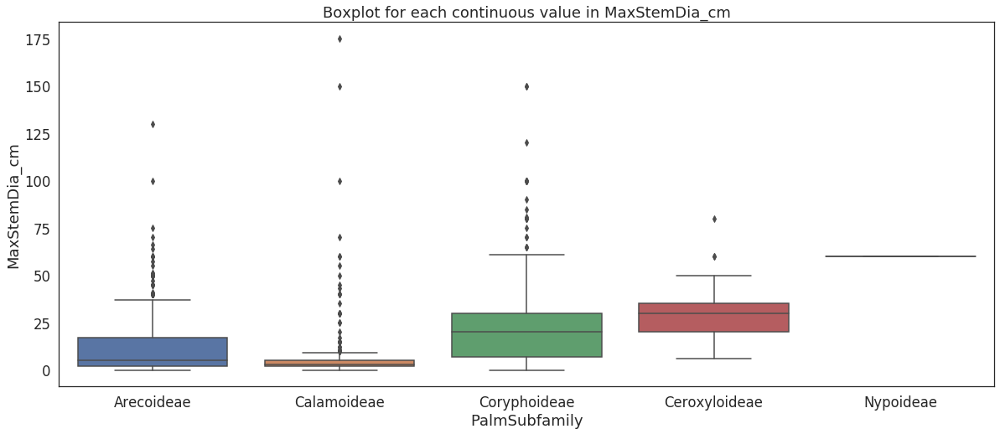

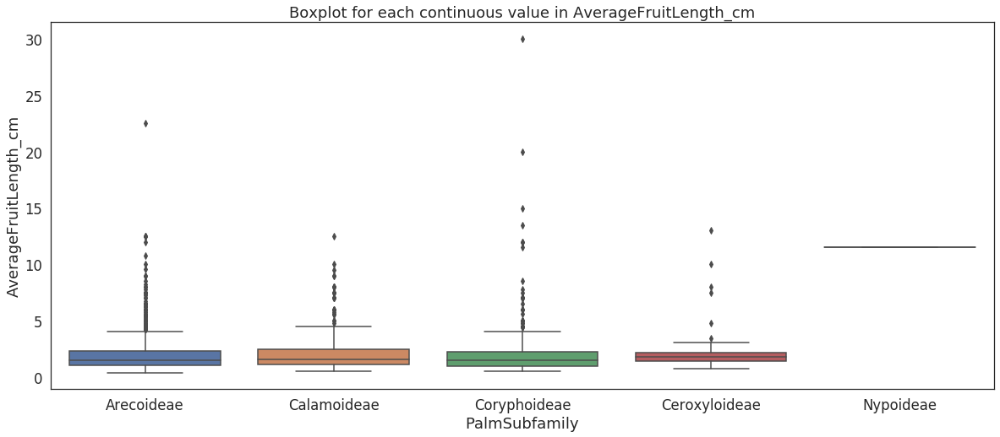

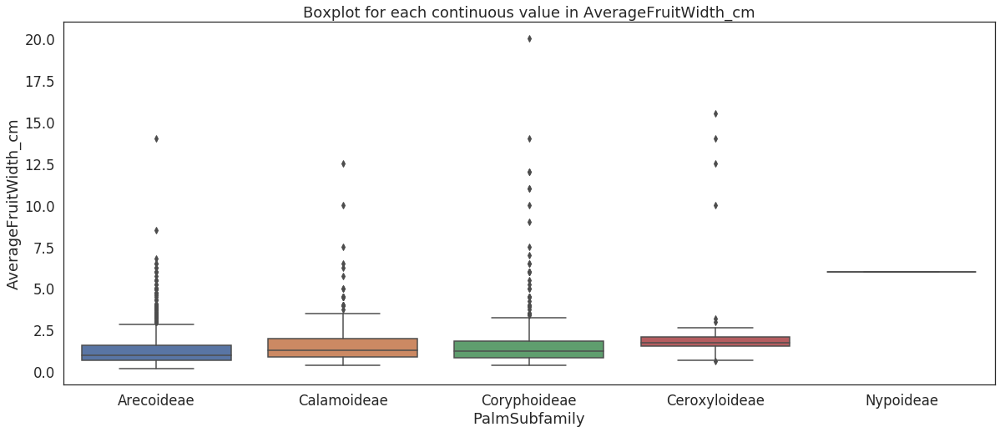

In [0]:
# Bivariate Analysis
for col in cont_col:
  plt.figure(figsize=(20,8))
  sns.boxplot(y=col, x="PalmSubfamily",order = palmtraits_fix_df['PalmSubfamily'].value_counts().index,data=palmtraits_fix_df)
  plt.title("Boxplot for each continuous value in "+col)
  plt.show()

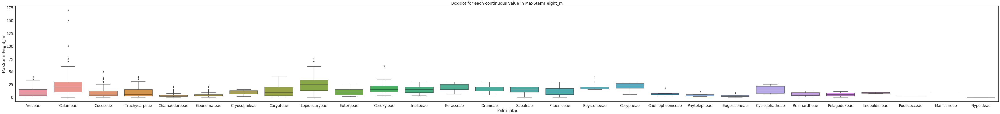

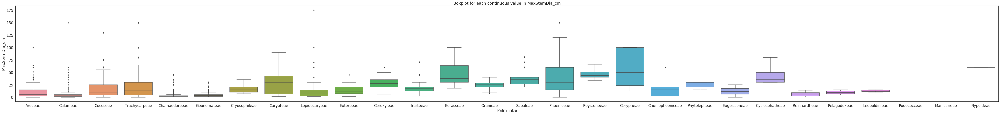

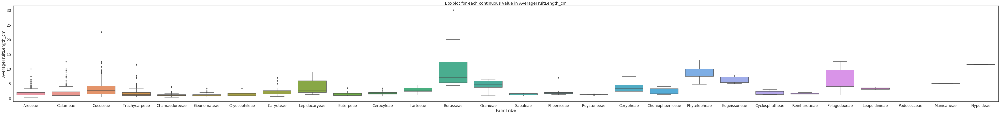

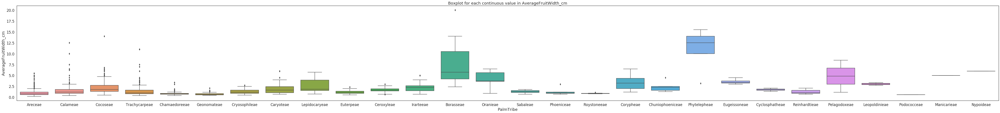

In [0]:
for col in cont_col:
  plt.figure(figsize=(80,8))
  sns.boxplot(y=col, x="PalmTribe",order=palmtraits_fix_df['PalmTribe'].value_counts().index,data=palmtraits_fix_df)
  plt.title("Boxplot for each continuous value in "+col)
  plt.show()

Correlation heat map of continuous features shows some interesting insight with max stem diameters

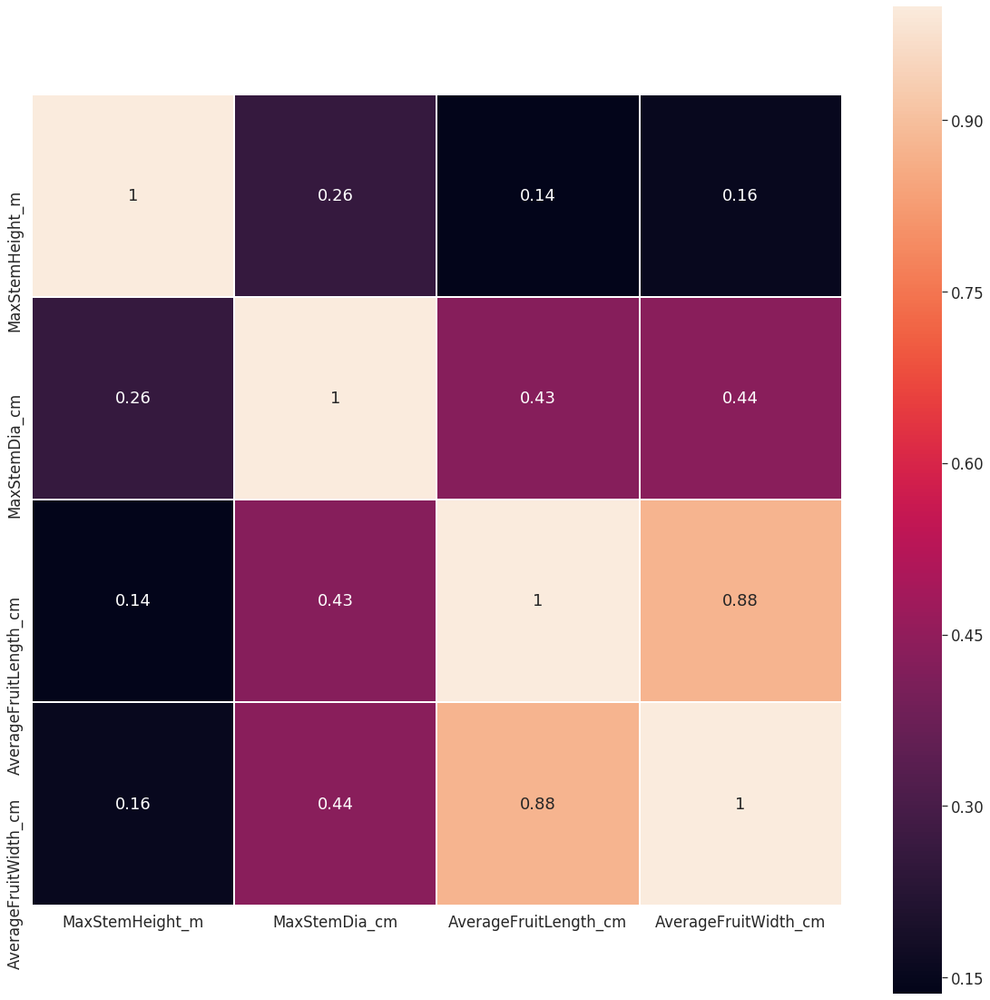

In [0]:
# Correlation Heat Map
corrmat = palmtraits_fix_df[cont_col].corr()
plt.figure(figsize=(20,20))
sns.heatmap(corrmat, square=True, annot=True, linewidths=1)

# Dimensionality Reduction Method


---



We begin our Unsupervised modelling with dimensionality reduction methods to decode the undelying clustering patterns in the input. 

First the input and target data is prepared in following steps
1. Taxonomy PalmSubFamily and PalmTribe Tickers are assigned with numeric values 1,2,3 and so on
2. Dummy variables for the two categorical features are created
3. Training Input Dataset is created and standardized for model runs.

In [0]:
uniq_val= palmtraits_fix_df['PalmSubfamily'].unique()
uniq_val

array(['Arecoideae', 'Coryphoideae', 'Ceroxyloideae', 'Calamoideae',
       'Nypoideae'], dtype=object)

In [0]:
# Creating tickers for subfamily
uniq_val= palmtraits_fix_df['PalmSubfamily'].unique()
cnt = 0
for val in uniq_val:
  cnt += 1
  cond = (palmtraits_fix_df['PalmSubfamily'] == val)
  palmtraits_fix_df.loc[cond,'PalmSubfamily_Tick'] = int(cnt)

# Creating tickers for tribe
uniq_val= palmtraits_fix_df['PalmTribe'].unique()
cnt = 0
for val in uniq_val:
  cnt += 1
  cond = (palmtraits_fix_df['PalmTribe'] == val)
  palmtraits_fix_df.loc[cond,'PalmTribe_Tick'] = int(cnt)

In [0]:
# Creating Dummy Datasets
cat_dummy_df = pd.get_dummies(palmtraits_fix_df[cat_col], drop_first=True)
cat_dummy_df2 = pd.get_dummies(palmtraits_fix_df['PalmSubfamily'])
cat_dummy_df2 = cat_dummy_df2.drop('Nypoideae', axis = 1)

In [0]:
# Defining input and target variable
X = pd.concat([palmtraits_fix_df[binary_col],palmtraits_fix_df[cont_col],cat_dummy_df],axis=1)
X2 = pd.concat([palmtraits_fix_df[binary_col],palmtraits_fix_df[cont_col],cat_dummy_df,cat_dummy_df2],axis=1)
y = palmtraits_fix_df['PalmSubfamily_Tick']
z = palmtraits_fix_df['PalmTribe_Tick']

# Standarizing the features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)
X2_std = scaler.fit_transform(X2)

With the standardized input "X_Std", an initial dimension reduction was done to two component using Principal Component, T-SNE and UMAP methods with default parameters.

We observed that all three methods show different clusteing patterns. PCA, in general shows three linearly separated clusters that is reminiscent of the three palm subfamily. T-SNE shows five large cluster that are linearly separable along with many small clusters with low data population. Similarly UMAP method shows five major cluster surrounded by scattered small clusters.

When overlayed with subfamily and tribe, we observe the cluster to be somewhat mixed. Ideally, we would like to have the colored dots separated based on the clustering patterns. Forexample, green dot is overall distributed in most of the clusters. However, cluster 3 in PCA (and cluster 5 in t-SNE and UMAP) are composed of a different taxonomy.

PCA component reduction is straightforward. t-SNE and UMAP parameters must be hypertunned to achieve an optimal dimension reduction and declustering.

In [0]:
# We just want the first two principal components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_std)

# TSNE
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=300)
tsne_results = tsne.fit_transform(X_std)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

# Umap dimensional reduction
time_start = time.time()
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)
print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 1647 samples in 0.003s...
[t-SNE] Computed neighbors for 1647 samples in 0.229s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1647
[t-SNE] Computed conditional probabilities for sample 1647 / 1647
[t-SNE] Mean sigma: 0.553705
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.592270
[t-SNE] KL divergence after 300 iterations: 0.299651
t-SNE done! Time elapsed: 7.184524059295654 seconds


/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 20 separate connected components using meta-embedding (experimental)
  n_components


UMAP done! Time elapsed: 2.8430137634277344 seconds


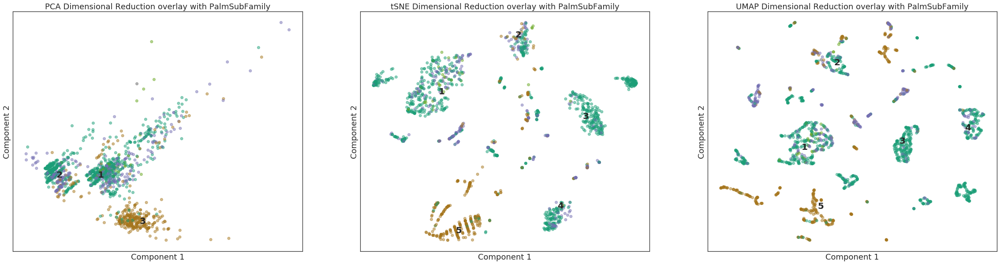

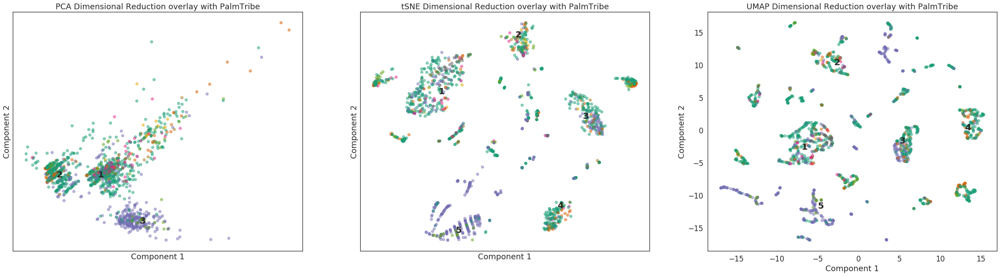

In [0]:
# Component Projection
fig = plt.figure(figsize=(40,10))
plt.subplot(1, 3, 1)
plt.scatter(pca_components[:,0], pca_components[:,1],c=y,alpha = 0.5,cmap='Dark2')
plt.text(0, 0, '1',fontdict={'weight': 'bold', 'size': 20})
plt.text(-2, 0, '2',fontdict={'weight': 'bold', 'size': 20})
plt.text(2, -3, '3',fontdict={'weight': 'bold', 'size': 20})
plt.xticks([])
plt.yticks([])
plt.title("PCA Dimensional Reduction overlay with PalmSubFamily")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
#plt.axis('off')
plt.subplot(1, 3, 2)
plt.scatter(tsne_results[:,0], tsne_results[:,1],c=y,alpha = 0.5,cmap='Dark2')
plt.text(-7, 5, '1',fontdict={'weight': 'bold', 'size': 20})
plt.text(2, 12, '2',fontdict={'weight': 'bold', 'size': 20})
plt.text(10, 2, '3',fontdict={'weight': 'bold', 'size': 20})
plt.text(7, -9, '4',fontdict={'weight': 'bold', 'size': 20})
plt.text(-5, -12, '5',fontdict={'weight': 'bold', 'size': 20})
plt.xticks([])
plt.yticks([])
plt.title("tSNE Dimensional Reduction overlay with PalmSubFamily")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
#plt.axis('off')
plt.subplot(1, 3, 3)
plt.scatter(umap_results[:,0], umap_results[:,1],c=y, alpha = 0.5,cmap='Dark2')
plt.text(-7, -3, '1',fontdict={'weight': 'bold', 'size': 20})
plt.text(-3, 10, '2',fontdict={'weight': 'bold', 'size': 20})
plt.text(5, -2, '3',fontdict={'weight': 'bold', 'size': 20})
plt.text(13, 0, '4',fontdict={'weight': 'bold', 'size': 20})
plt.text(-5, -12, '5',fontdict={'weight': 'bold', 'size': 20})
plt.xticks([])
plt.yticks([])
plt.title("UMAP Dimensional Reduction overlay with PalmSubFamily")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.show()

str1 = ' with PalmTribe'
# Component Projection
fig = plt.figure(figsize=(40,10))
plt.subplot(1, 3, 1)
plt.scatter(pca_components[:,0], pca_components[:,1],c=z,alpha = 0.5,cmap='Dark2')
plt.text(0, 0, '1',fontdict={'weight': 'bold', 'size': 20})
plt.text(-2, 0, '2',fontdict={'weight': 'bold', 'size': 20})
plt.text(2, -3, '3',fontdict={'weight': 'bold', 'size': 20})
plt.xticks([])
plt.yticks([])
plt.title("PCA Dimensional Reduction overlay"+str1)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
#plt.axis('off')
plt.subplot(1, 3, 2)
plt.scatter(tsne_results[:,0], tsne_results[:,1],c=z,alpha = 0.5,cmap='Dark2')
plt.text(-7, 5, '1',fontdict={'weight': 'bold', 'size': 20})
plt.text(2, 12, '2',fontdict={'weight': 'bold', 'size': 20})
plt.text(10, 2, '3',fontdict={'weight': 'bold', 'size': 20})
plt.text(7, -9, '4',fontdict={'weight': 'bold', 'size': 20})
plt.text(-5, -12, '5',fontdict={'weight': 'bold', 'size': 20})
plt.xticks([])
plt.yticks([])
plt.title("tSNE Dimensional Reduction overlay"+str1)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
#plt.axis('off')
plt.subplot(1, 3, 3)
plt.scatter(umap_results[:,0], umap_results[:,1],c=z, alpha = 0.5,cmap='Dark2')
plt.text(-7, -3, '1',fontdict={'weight': 'bold', 'size': 20})
plt.text(-3, 10, '2',fontdict={'weight': 'bold', 'size': 20})
plt.text(5, -2, '3',fontdict={'weight': 'bold', 'size': 20})
plt.text(13, 0, '4',fontdict={'weight': 'bold', 'size': 20})
plt.text(-5, -12, '5',fontdict={'weight': 'bold', 'size': 20})
#plt.xticks([])
#plt.yticks([])
plt.title("UMAP Dimensional Reduction overlay"+str1)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.show()

## Hyper Parameter Tuning in Dimensionality Reduction
1. **t-SNE performance**
- Testing Perplexity from 1 to 100: Perplexity of 70 is the optimal value to use. A smaller perplexity gives scatter distribution. With increase perplexity we observed the cluster to coalesce into separable groups. Past perplexity = 70, the clustering patterns are more or less similar.
- Testing number of iteration from 250 to 2000: With increasing iteration the cluster becomes more compact. 500 iteration is overall sufficient to cluster datapoints.

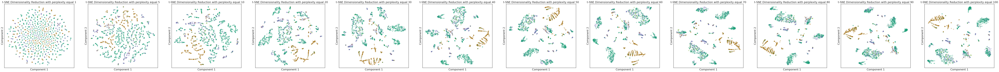

In [0]:
# Hypertunning t-SNE: Perplexity
perpl = [1,5,10,20,30,40,50,60,70,80,90,100]
fig = plt.figure(figsize=(10*len(perpl),8))
cnt = 0
for val in perpl:
  cnt += 1
  tsne = TSNE(n_components=2, verbose=0, perplexity=val, n_iter=300)
  tsne_results = tsne.fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(perpl), cnt)
  plt.scatter(tsne_results[:,0], tsne_results[:,1],c=y,cmap='Dark2',alpha = 0.3)
  plt.xticks([])
  plt.yticks([])
  plt.title("t-SNE Dimensionality Reduction with perplexity equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

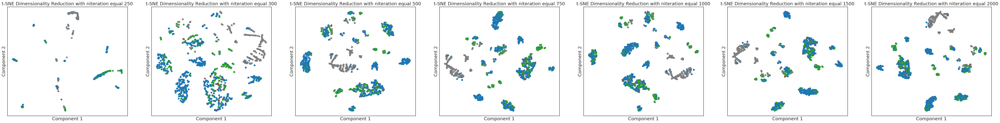

In [0]:
# Hypertunning t-SNE: Number of Iteration
iiter = [250,300,500,750,1000,1500,2000]
plt.figure(figsize=(10*len(iiter),8))
cnt = 0
for val in iiter:
  cnt += 1
  tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=val)
  tsne_results = tsne.fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(iiter), cnt)
  plt.scatter(tsne_results[:,0], tsne_results[:,1],c=y,cmap='tab10')
  plt.xticks([])
  plt.yticks([])
  plt.title("t-SNE Dimensionality Reduction with niteration equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

plt.figure(figsize=(10*len(iiter),8))
cnt = 0
for val in iiter:
  cnt += 1
  tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=val)
  tsne_results = tsne.fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(iiter), cnt)
  plt.scatter(tsne_results[:,0], tsne_results[:,1],c=z,cmap='tab10')
  plt.xticks([])
  plt.yticks([])
  plt.title("t-SNE Dimensionality Reduction with niteration equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

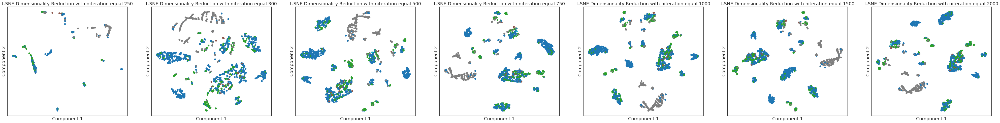

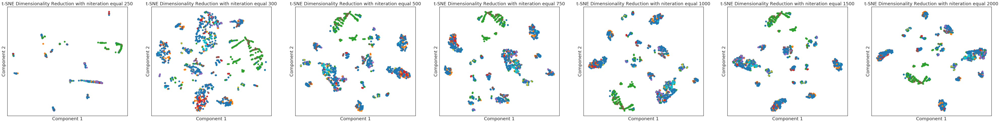

In [0]:
# Hypertunning t-SNE: Number of Iteration
iiter = [250,300,500,750,1000,1500,2000]
plt.figure(figsize=(10*len(iiter),8))
cnt = 0
for val in iiter:
  cnt += 1
  tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=val)
  tsne_results = tsne.fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(iiter), cnt)
  plt.scatter(tsne_results[:,0], tsne_results[:,1],c=y,cmap='tab10')
  plt.xticks([])
  plt.yticks([])
  plt.title("t-SNE Dimensionality Reduction with niteration equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

plt.figure(figsize=(10*len(iiter),8))
cnt = 0
for val in iiter:
  cnt += 1
  tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=val)
  tsne_results = tsne.fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(iiter), cnt)
  plt.scatter(tsne_results[:,0], tsne_results[:,1],c=z,cmap='tab10')
  plt.xticks([])
  plt.yticks([])
  plt.title("t-SNE Dimensionality Reduction with niteration equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

2. **UMAP Performance**
- Testing n_neighbours from 2 to 50: n_neigh = 10 gives an acceptable distribution.
- Testing min_dist from 0.0 to 0.9: min dist of 0.99 is choosen to give a reasonable visual of clustering
- Testing metric: Overall difference is subtle. Correlation based metric is choosen.

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 437 separate connected components using meta-embedding (experimental)
  n_components
/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 20 separate connected components using meta-embedding (experimental)
  n_components
/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 9 separate connected components using meta-embedding (experimental)
  n_components


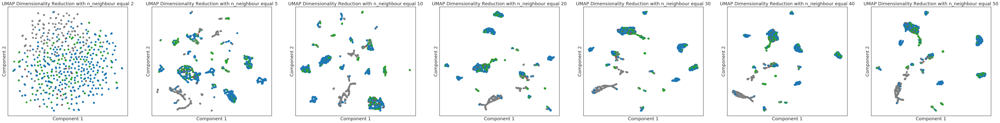

In [0]:
num_neigh = [2,5,10,20,30,40,50]
plt.figure(figsize=(10*len(num_neigh),8))
cnt = 0
for val in num_neigh:
  cnt += 1
  umap_results = umap.UMAP(n_neighbors=val,min_dist=0.3,metric='correlation').fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(num_neigh), cnt)
  plt.scatter(umap_results[:,0], umap_results[:,1],c=y,cmap='tab10')
  plt.xticks([])
  plt.yticks([])
  plt.title("UMAP Dimensionality Reduction with n_neighbour equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

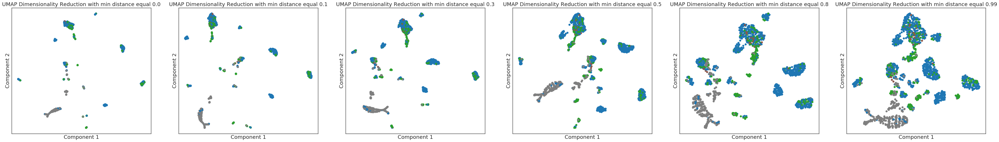

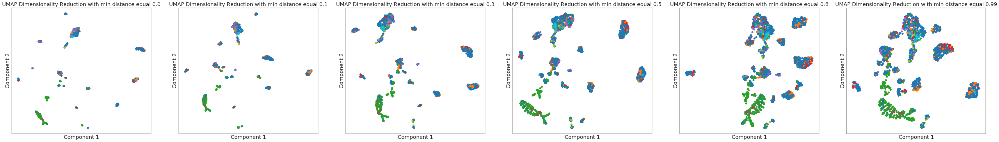

In [0]:
dist = [0.0, 0.1, 0.3, 0.5, 0.8, 0.99]
# Performance Plot with Subfamily color overlay
plt.figure(figsize=(10*len(dist),8))
cnt = 0
for val in dist:
  cnt += 1
  umap_results = umap.UMAP(n_neighbors=50,min_dist=val,metric='correlation').fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(dist), cnt)
  plt.scatter(umap_results[:,0], umap_results[:,1],c=y,cmap='tab10')
  plt.xticks([])
  plt.yticks([])
  plt.title("UMAP Dimensionality Reduction with min distance equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

# Performance Plot with Tribe color overlay
plt.figure(figsize=(10*len(dist),8))
cnt = 0
for val in dist:
  cnt += 1
  umap_results = umap.UMAP(n_neighbors=50,min_dist=val,metric='correlation').fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(dist), cnt)
  plt.scatter(umap_results[:,0], umap_results[:,1],c=z,cmap='tab10')
  plt.xticks([])
  plt.yticks([])
  plt.title("UMAP Dimensionality Reduction with min distance equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


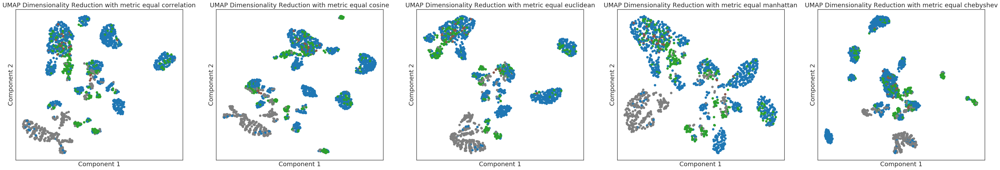

In [0]:
met = ['correlation','cosine','euclidean','manhattan','chebyshev']
plt.figure(figsize=(10*len(met),8))
cnt = 0
for val in met:
  cnt += 1
  umap_results = umap.UMAP(n_neighbors=50,min_dist=0.99,metric=val).fit_transform(X_std)
  # Plot tsne results
  plt.subplot(1, len(met), cnt)
  plt.scatter(umap_results[:,0], umap_results[:,1],c=y,cmap='tab10')
  plt.xticks([])
  plt.yticks([])
  plt.title("UMAP Dimensionality Reduction with metric equal "+str(val))
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
plt.show()

We revisit the dimentionality reduction using hypertunned parameters of t-SNE and UMAP methods. Clustering in UMAP have improved with more distinct grouping.
When plotting the PalmSubfamily and PalmTribe, it is observed that the mapping is still not one-to one. We observe cluster populated with most green dots followed by brown and violet (for PalmSubfamily)

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 9 separate connected components using meta-embedding (experimental)
  n_components


<Figure size 720x576 with 0 Axes>

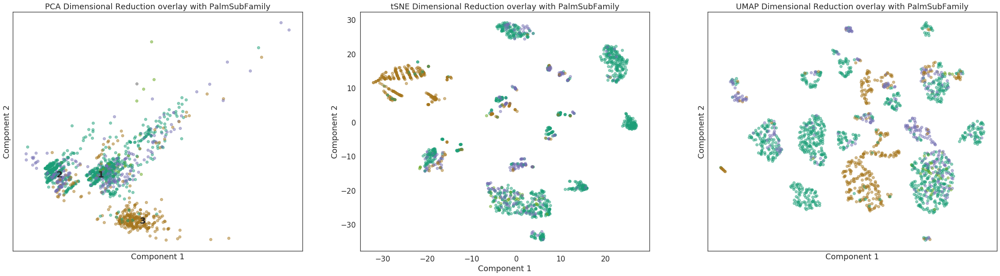

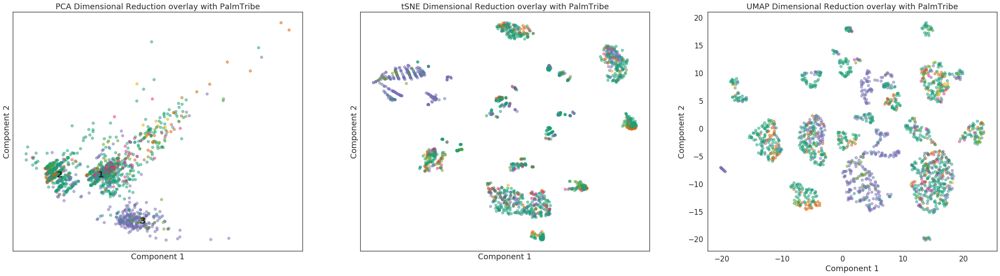

In [0]:

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10,8))
#plt.scatter(pca_components[:,0], pca_components[:,1], c=y)
#fig = plt.figure()

pca_components = PCA(n_components=2).fit_transform(X_std)
tsne_results = TSNE(n_components=2, verbose=0, perplexity=70, n_iter=500).fit_transform(X_std)
umap_results = umap.UMAP(n_neighbors=10,min_dist=0.99,metric='correlation').fit_transform(X_std)

# Component Projection
fig = plt.figure(figsize=(40,10))
plt.subplot(1, 3, 1)
plt.scatter(pca_components[:,0], pca_components[:,1],c=y,alpha = 0.5,cmap='Dark2')
plt.text(0, 0, '1',fontdict={'weight': 'bold', 'size': 20})
plt.text(-2, 0, '2',fontdict={'weight': 'bold', 'size': 20})
plt.text(2, -3, '3',fontdict={'weight': 'bold', 'size': 20})
plt.xticks([])
plt.yticks([])
plt.title("PCA Dimensional Reduction overlay with PalmSubFamily")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
#plt.axis('off')
plt.subplot(1, 3, 2)
plt.scatter(tsne_results[:,0], tsne_results[:,1],c=y,alpha = 0.5,cmap='Dark2')
#plt.xticks([])
#plt.yticks([])
plt.title("tSNE Dimensional Reduction overlay with PalmSubFamily")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
#plt.axis('off')
plt.subplot(1, 3, 3)
plt.scatter(umap_results[:,0], umap_results[:,1],c=y, alpha = 0.5,cmap='Dark2')
plt.xticks([])
plt.yticks([])
plt.title("UMAP Dimensional Reduction overlay with PalmSubFamily")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.show()

str1 = ' with PalmTribe'
# Component Projection
fig = plt.figure(figsize=(40,10))
plt.subplot(1, 3, 1)
plt.scatter(pca_components[:,0], pca_components[:,1],c=z,alpha = 0.5,cmap='Dark2')
plt.text(0, 0, '1',fontdict={'weight': 'bold', 'size': 20})
plt.text(-2, 0, '2',fontdict={'weight': 'bold', 'size': 20})
plt.text(2, -3, '3',fontdict={'weight': 'bold', 'size': 20})
plt.xticks([])
plt.yticks([])
plt.title("PCA Dimensional Reduction overlay"+str1)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
#plt.axis('off')
plt.subplot(1, 3, 2)
plt.scatter(tsne_results[:,0], tsne_results[:,1],c=z,alpha = 0.5,cmap='Dark2')
plt.xticks([])
plt.yticks([])
plt.title("tSNE Dimensional Reduction overlay"+str1)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
#plt.axis('off')
plt.subplot(1, 3, 3)
plt.scatter(umap_results[:,0], umap_results[:,1],c=z, alpha = 0.5,cmap='Dark2')
#plt.xticks([])
#plt.yticks([])
plt.title("UMAP Dimensional Reduction overlay"+str1)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.show()

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 9 separate connected components using meta-embedding (experimental)
  n_components


<Figure size 720x576 with 0 Axes>

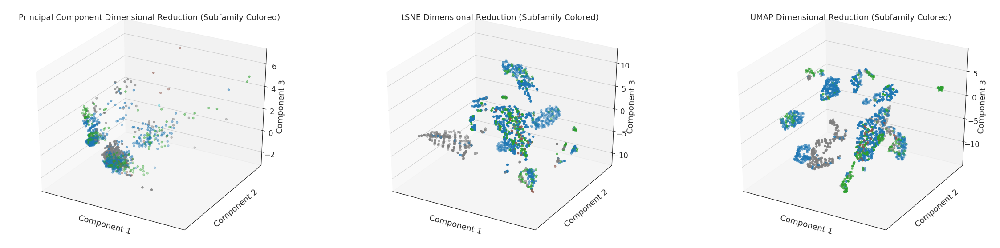

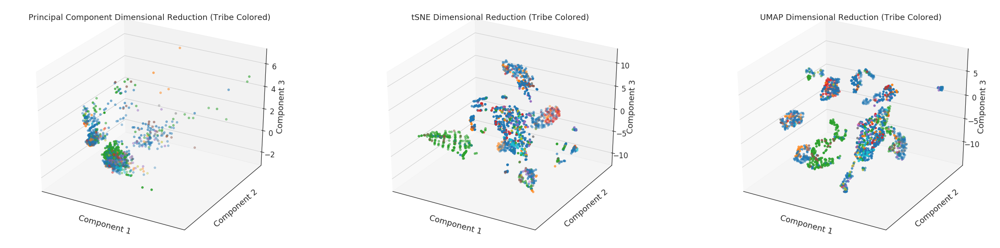

In [0]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10,8))
#plt.scatter(pca_components[:,0], pca_components[:,1], c=y)
#fig = plt.figure()

pca_components = PCA(n_components=3).fit_transform(X_std)
tsne_results = TSNE(n_components=3, verbose=0, perplexity=70, n_iter=500).fit_transform(X_std)
umap_results = umap.UMAP(n_components=3,n_neighbors=10,min_dist=0.99,metric='correlation').fit_transform(X_std)

fig = plt.figure(figsize=(40,10))
ax = fig.add_subplot(131, projection="3d")
ax.scatter(pca_components[:,0], pca_components[:,1], pca_components[:,2],c=y,cmap = 'tab10')
plt.xticks([])
plt.yticks([])
plt.title('Principal Component Dimensional Reduction (Subfamily Colored)')
plt.xlabel("Component 1")
plt.ylabel("Component 2")
ax.set_zlabel('Component 3')
#plt.axis('off')
ax = fig.add_subplot(132, projection="3d")
ax.scatter(tsne_results[:,0], tsne_results[:,1], tsne_results[:,2],c=y,cmap = 'tab10')
plt.xticks([])
plt.yticks([])
plt.title('tSNE Dimensional Reduction (Subfamily Colored)')
plt.xlabel("Component 1")
plt.ylabel("Component 2")
ax.set_zlabel('Component 3')
#plt.axis('off')
ax = fig.add_subplot(133, projection="3d")
ax.scatter(umap_results[:,0], umap_results[:,1], umap_results[:,2],c=y,cmap = 'tab10')
plt.xticks([])
plt.yticks([])
plt.title('UMAP Dimensional Reduction (Subfamily Colored)')
plt.xlabel("Component 1")
plt.ylabel("Component 2")
ax.set_zlabel('Component 3')
plt.show()

fig = plt.figure(figsize=(40,10))
ax = fig.add_subplot(131, projection="3d")
ax.scatter(pca_components[:,0], pca_components[:,1], pca_components[:,2],c=z,cmap = 'tab10')
plt.xticks([])
plt.yticks([])
plt.title('Principal Component Dimensional Reduction (Tribe Colored)')
plt.xlabel("Component 1")
plt.ylabel("Component 2")
ax.set_zlabel('Component 3')
#plt.axis('off')
ax = fig.add_subplot(132, projection="3d")
ax.scatter(tsne_results[:,0], tsne_results[:,1], tsne_results[:,2],c=z,cmap = 'tab10')
plt.xticks([])
plt.yticks([])
plt.title('tSNE Dimensional Reduction (Tribe Colored)')
plt.xlabel("Component 1")
plt.ylabel("Component 2")
ax.set_zlabel('Component 3')
#plt.axis('off')
ax = fig.add_subplot(133, projection="3d")
ax.scatter(umap_results[:,0], umap_results[:,1], umap_results[:,2],c=z,cmap = 'tab10')
plt.xticks([])
plt.yticks([])
plt.title('UMAP Dimensional Reduction (Tribe Colored)')
plt.xlabel("Component 1")
plt.ylabel("Component 2")
ax.set_zlabel('Component 3')
plt.show()

#Unsupervised Learning


---

We now run the unsupervised modelling using the input features and cross reference it with Palmsubfamily and Palmtribe. Multiple models are tuned and tested with the same input with the objective to get consistent results. In total 4 methods are tested:
1. K Means 
2. Agglomerate Clustering
3. DBSCAN
4. Gaussian Mixture Model

We calculate the performance score of the prediction in two parts:
1. **Silhouette Score**: Represent the cluster prediction in unsupervised fashion
2. **ARI Score (Y)**: Classification of clusters based on taxonomy PalmSubfamily
3. **ARI Score (Z)**: Classification of clusters based on taxonmy PalmTribe


In [0]:
# Function for Ploting clustering
def pca_plot(X_std, y, y_pred,title):  
  pca = PCA(n_components=2).fit_transform(X_std)
  plt.figure(figsize=(1.5,1.5))
  colours = ['r','b','g','m','c','k','y']
  for i in range(pca.shape[0]):
    col_str = str(colours[int(y[i])])
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),color=col_str,fontdict={'weight': 'bold', 'size': 10})
  plt.text(np.min(np.array(pca[:, 0])), np.max(np.array(pca[:, 1])), title,fontdict={'weight': 'bold', 'size': 20})
  plt.xticks([])
  plt.yticks([])
  plt.axis('off')
  plt.show()

def umap_plot(X_std, y, y_pred,title):  
  umap_mat = umap.UMAP(n_components=2,n_neighbors=10,min_dist=0.99,metric='correlation').fit_transform(X_std)
  plt.figure(figsize=(0.4,0.4))
  colours = ['r','b','g','m','c','k','y']
  for i in range(umap_mat.shape[0]):
    col_str = str(colours[int(y[i])])
    plt.text(umap_mat[i, 0], umap_mat[i, 1], str(y_pred[i]),color=col_str,fontdict={'weight': 'bold', 'size': 10})
  plt.text(np.min(np.array(umap_mat[:, 0])), np.max(np.array(umap_mat[:, 1])), title,fontdict={'weight': 'bold', 'size': 20})
  plt.xticks([])
  plt.yticks([])
  plt.axis('off')
  plt.show()

In [0]:
def score_plot(x,ari_mean_mat,ari_std_mat,z_ari_mean_mat,z_ari_std_mat,silh_mean_mat,silh_std_mat, test_clus):
  plt.figure(figsize=(30,8))
  # Silhouette Score
  plt.subplot(1, 3, 1)
  plt.plot(x, silh_mean_mat - silh_std_mat,color='orange', linestyle='-',linewidth=1)
  plt.plot(x, silh_mean_mat + silh_std_mat,color='orange', linestyle='-',linewidth=1)
  plt.plot(x, silh_mean_mat,marker='o', linestyle='dashed',color='orange',linewidth=2, markersize=12)
  plt.fill_between(x, silh_mean_mat - silh_std_mat, silh_mean_mat + silh_std_mat,color = 'orange',alpha = 0.2)
  plt.xlabel("Number of Cluster")
  plt.ylabel(test_clus+": Silhouette Score")
  plt.ylim(0,0.5)
  plt.title("Silhouette Score v/s "+test_clus+" Clusters")
  # ARI Score: Y
  plt.subplot(1, 3, 2)
  plt.plot(x, ari_mean_mat - ari_std_mat,color='green', linestyle='-',linewidth=1)
  plt.plot(x, ari_mean_mat + ari_std_mat,color='green', linestyle='-',linewidth=1)
  plt.plot(x, ari_mean_mat,marker='o', linestyle='dashed',color='green',linewidth=2, markersize=12)
  plt.fill_between(x, ari_mean_mat - ari_std_mat, ari_mean_mat + ari_std_mat,color = 'green',alpha = 0.2)
  plt.xlabel("Number of Cluster")
  plt.ylabel(test_clus+": ARI Score")
  plt.ylim(0,0.5)
  plt.title("ARI Score (Y) v/s "+test_clus+" Clusters")
  # ARI Score: Z
  plt.subplot(1, 3, 3)
  plt.plot(x, z_ari_mean_mat - z_ari_std_mat,color='green', linestyle='-',linewidth=1)
  plt.plot(x, z_ari_mean_mat + z_ari_std_mat,color='green', linestyle='-',linewidth=1)
  plt.plot(x, z_ari_mean_mat,marker='o', linestyle='dashed',color='green',linewidth=2, markersize=12)
  plt.fill_between(x, z_ari_mean_mat - z_ari_std_mat, z_ari_mean_mat + z_ari_std_mat,color = 'green',alpha = 0.2)
  plt.xlabel("Number of Cluster")
  plt.ylabel(test_clus+": ARI Score")
  plt.ylim(0,0.5)
  plt.title("ARI Score (Z) v/s "+test_clus+" Clusters")
  plt.show()

##1. K Means Method

The K means prediction was run with the standardized input. Modelling iteration were ran with 50 different random states and a mean prediction and its corresponing deviation (or rms error) was calculated. K Means modeling was done by varying the n_cluster parameter from 2 to 10.


*   Maximum Silhouette Score: 0.4 for 6-7 cluster
*   ARI Score Y: 0.24 for n_cluster: 3
*   ARI Score Z: 0.21 for n_cluster: 6

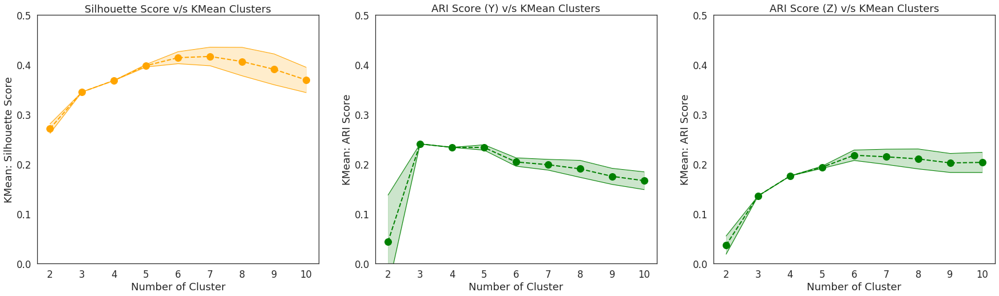

In [0]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn import datasets, metrics

# Defining the k-means
cluster_numbers = np.arange(2,11,1)
random_state = np.arange(1,51,1)

# Kmean ARI and Silhouette Score Database 
kmeans_score_df = pd.DataFrame()
kmeans_score_df['random_state'] = random_state
for j in random_state:
  for i in cluster_numbers:
      k_means = KMeans(n_clusters=i, random_state=j)
      full_pred = k_means.fit_predict(X_std)
      kmeans_score_df.loc[kmeans_score_df['random_state'] == j,'y_ari_clus_'+str(i)]  = metrics.adjusted_rand_score(y, full_pred)
      kmeans_score_df.loc[kmeans_score_df['random_state'] == j,'z_ari_clus_'+str(i)]  = metrics.adjusted_rand_score(z, full_pred)
      kmeans_score_df.loc[kmeans_score_df['random_state'] == j,'silh_clus_'+str(i)] = metrics.silhouette_score(X_std, full_pred, metric='euclidean')

# Plotting the Elbow Graph
y_ari_col  = ['y_ari_clus_'+str(i) for i in cluster_numbers]
z_ari_col  = ['z_ari_clus_'+str(i) for i in cluster_numbers]
silh_col = ['silh_clus_'+str(i) for i in cluster_numbers]
score_plot(cluster_numbers,kmeans_score_df[y_ari_col].mean(),kmeans_score_df[y_ari_col].std(),kmeans_score_df[z_ari_col].mean(),kmeans_score_df[z_ari_col].std(),kmeans_score_df[silh_col].mean(),kmeans_score_df[silh_col].std(), 'KMean')

10 loops, best of 3: 52.4 ms per loop


/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 9 separate connected components using meta-embedding (experimental)
  n_components


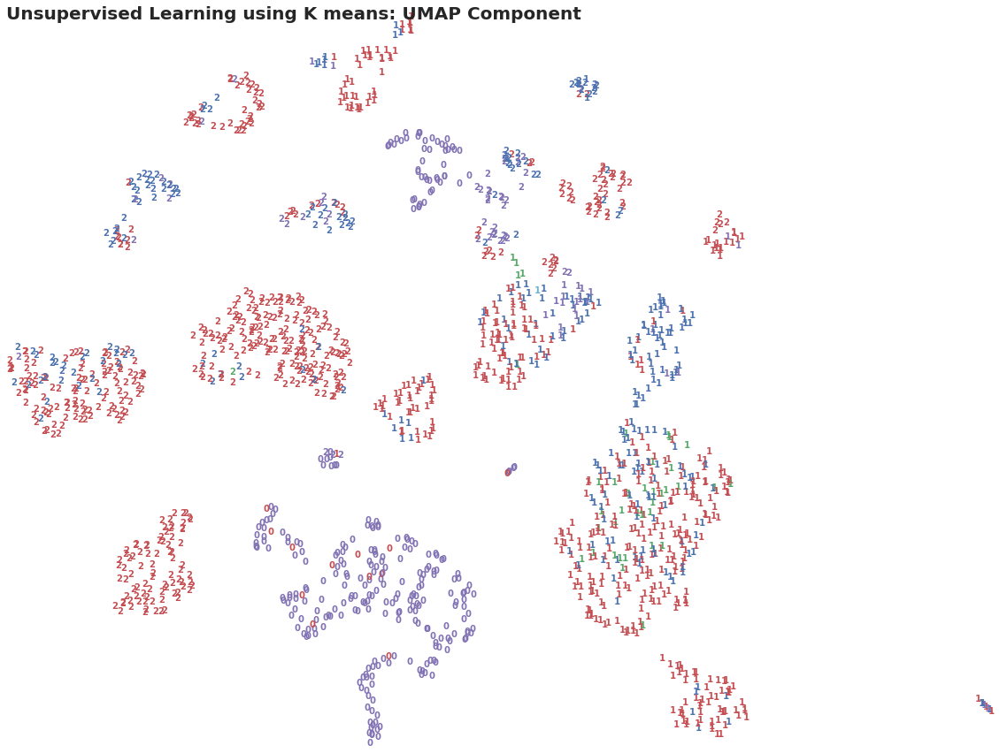

In [0]:
from sklearn.cluster import KMeans, MiniBatchKMeans
kmeans_cluster = KMeans(n_clusters=3, random_state=123)

# Fit model
%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

#pca_plot(X_std,y.values-1,y_pred,'Unsupervised Learning using K means: PCA Component')
umap_plot(X_std,y.values-1,y_pred,'Unsupervised Learning using K means: UMAP Component')

In [0]:
print ('\033[1m'+ "KMeans: Crosstab of Prediction versus Subfamily Label")
pd.crosstab(y, 1+y_pred) 

KMeans: Crosstab of Prediction versus Subfamily Label


col_0,1,2,3
PalmSubfamily_Tick,,,
1.0,12,452,484
2.0,0,186,116
3.0,0,38,1
4.0,281,25,51
5.0,0,1,0


We observed from Consistency Test that upto cluster 6 the distributions are similar. Differences in clustering appears above 7 clusters 

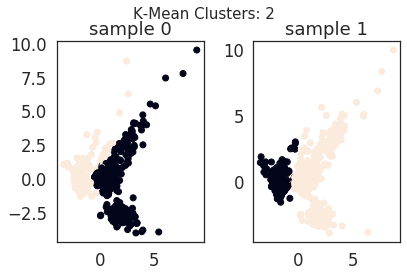

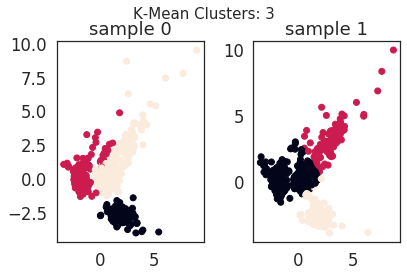

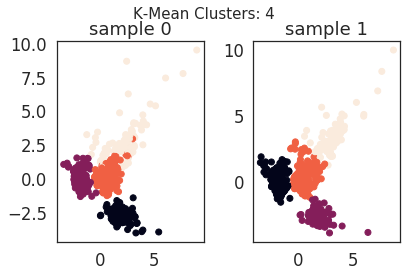

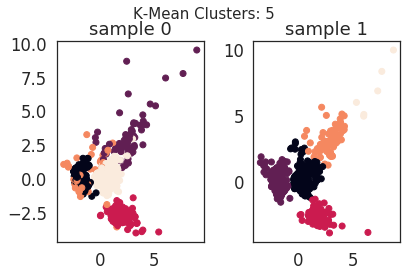

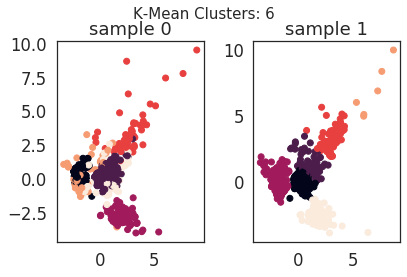

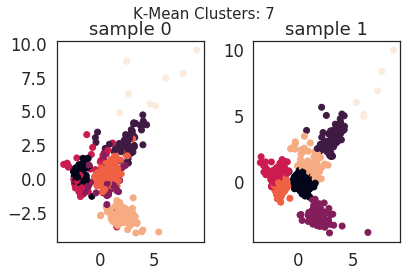

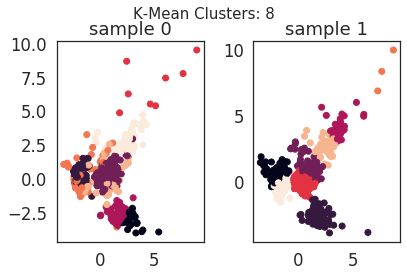

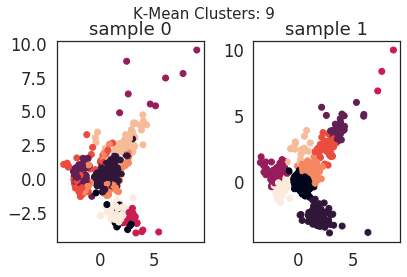

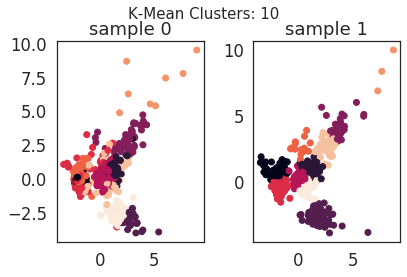

In [0]:
from sklearn.model_selection import train_test_split

# Balancing training dataset evently
y_blnc =y[y != 5.0]
X_std_blnc = X_std[y != 5.0]

# Split the data into four equally-sized samples. First we break it in half:
pca_components = PCA(n_components=2).fit_transform(X_std_blnc)
X_half1, X_half2, X_pcahalf1, X_pcahalf2 = train_test_split(X_std_blnc,pca_components,test_size=0.5,random_state=1)

# Data frame to store features and predicted cluster memberships.
ypred = pd.DataFrame()

# PCA solution in the data frame.
for counter, data in enumerate([
    (X_half1, X_pcahalf1),
    (X_half2, X_pcahalf2)]):
    
    # Put the features into ypred.
    ypred['pca_f1' + '_sample' + str(counter)] = data[1][:, 0]
    ypred['pca_f2' + '_sample' + str(counter)] = data[1][:, 1]
    
    # Generate cluster predictions and store them for clusters 2 to 4.
    for nclust in range(2, 11):
        pred = KMeans(n_clusters=nclust, random_state=123).fit_predict(data[counter])
        ypred['clust' + str(nclust) + '_sample' + str(counter)] = pred

# For each  number of clusters, plot the clusters using the
# pca features for each sample.
for cluster in range(2, 11):

    # Make a grid of subplots.
    f, axarr = plt.subplots(1, 2)
    # Make a plot for each sample.
    for i in range(2):
        
        # PCA-created features.
        x_sub = ypred['pca_f1_sample{}'.format(i)]
        y_sub = ypred['pca_f2_sample{}'.format(i)]
        
        # Cluster assignments.
        c = ypred['clust{}_sample{}'.format(cluster, i)]
        
        # Assign the subplot to its place on the grid.
        axarr[i].scatter(x_sub, y_sub, c=c)
        axarr[i].set_title('sample {}'.format(i))
    
    # Space out the plots so that the headings don't overlap axis values.
    plt.suptitle('K-Mean Clusters: {}'.format(cluster), fontsize=15)
    plt.tight_layout()
    plt.show()
    print('\n')

#2. Hierarchical Method: Agglomerate Clustering

As can be seen from dendrogram the linkage 'Ward' gives a balanced branching.
The model was run with affinity=euclidean, linkage='ward' and n_clustering between 2 to 10

Using ward linkage we deduce:
*   Maximum Silhouette Score: 0.42 for 10 cluster (max limit of testing)
*   ARI Score Y: 0.22 for n_cluster: 3
*   ARI Score Z: 0.21 for n_cluster 6 to 8








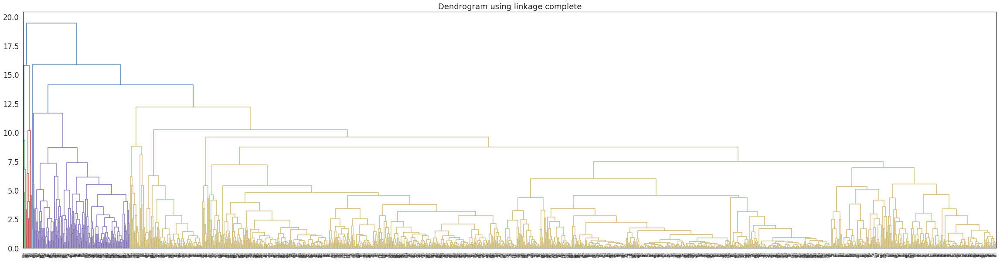

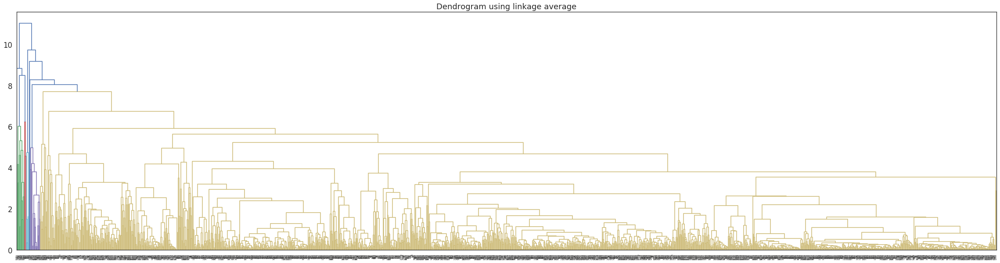

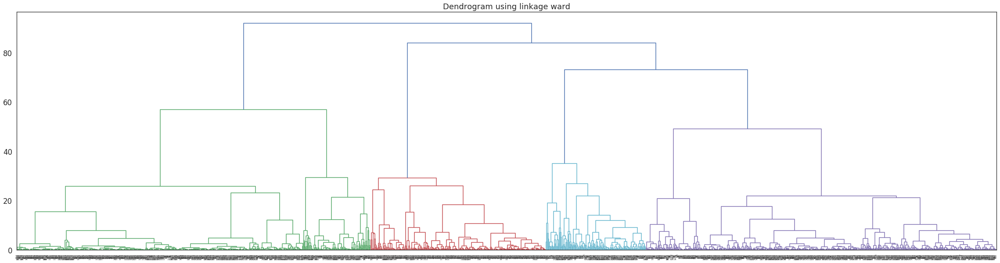

In [0]:
from scipy.cluster.hierarchy import dendrogram, linkage
mat = ['complete','average','ward']
for ind in mat:
  plt.figure(figsize=(40,10))
  dendrogram(linkage(X_std, method=ind))
  plt.title('Dendrogram using linkage '+ind)
  plt.show()

In [0]:
from sklearn.cluster import AgglomerativeClustering

mat = ['complete','average','ward']
for ind in mat:
  # Defining the agglomerative clustering
  if ind == 'ward' :
    y_pred = AgglomerativeClustering(linkage=ind, affinity='euclidean',n_clusters=6).fit_predict(X_std)
  else:
    y_pred = AgglomerativeClustering(linkage=ind, affinity='cosine',n_clusters=6).fit_predict(X_std)
  print ("ARI score on the Agglomerate clustering of linkage {} is {}".format(ind,metrics.adjusted_rand_score(y, y_pred)))

for ind in mat:
  # Defining the agglomerative clustering
  if ind == 'ward' :
    y_pred = AgglomerativeClustering(linkage=ind, affinity='euclidean',n_clusters=6).fit_predict(X_std)
  else:
    y_pred = AgglomerativeClustering(linkage=ind, affinity='cosine',n_clusters=6).fit_predict(X_std)
  print ("silhouette score on Agglomerate clustering of linkage {} is {}".format(ind,metrics.silhouette_score(X_std, y_pred, metric='euclidean')))

ARI score on the Agglomerate clustering of linkage complete is 0.20657800464570827
ARI score on the Agglomerate clustering of linkage average is 0.2077670910202579
ARI score on the Agglomerate clustering of linkage ward is 0.20947474254607462
silhouette score on Agglomerate clustering of linkage complete is 0.4109826649695908
silhouette score on Agglomerate clustering of linkage average is 0.41123416071811747
silhouette score on Agglomerate clustering of linkage ward is 0.4113770570389066


In [0]:
y_agglo_ari = []
z_agglo_ari = []
agglo_silh = []
for ind in cluster_numbers:
  y_pred = AgglomerativeClustering(linkage='ward', affinity='euclidean',n_clusters=ind).fit_predict(X_std)
  y_agglo_ari.append(metrics.adjusted_rand_score(y, y_pred))
  z_agglo_ari.append(metrics.adjusted_rand_score(z, y_pred))
  agglo_silh.append(metrics.silhouette_score(X_std, y_pred, metric='euclidean'))  

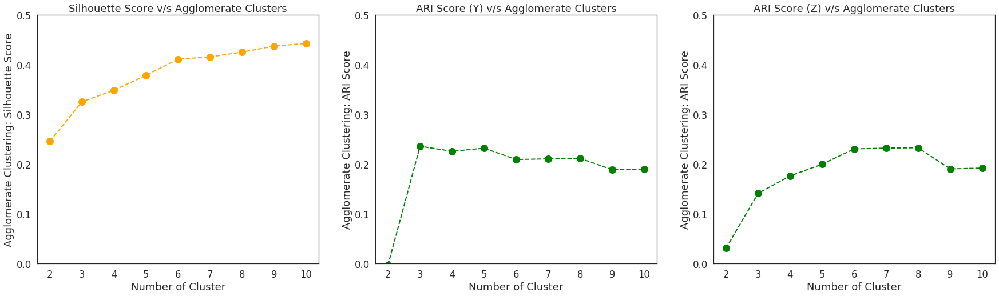

In [0]:
plt.figure(figsize=(30,8))
# Silhouette Score
plt.subplot(1, 3, 1)
plt.plot(cluster_numbers,agglo_silh,marker='o', linestyle='dashed',color='orange',linewidth=2, markersize=12)
plt.xlabel("Number of Cluster")
plt.ylabel("Agglomerate Clustering: Silhouette Score")
plt.ylim(0,0.5)
plt.title("Silhouette Score v/s Agglomerate Clusters")
# ARI Score
plt.subplot(1, 3, 2)
plt.plot(cluster_numbers,y_agglo_ari,marker='o', linestyle='dashed',color='green',linewidth=2, markersize=12)
plt.xlabel("Number of Cluster")
plt.ylabel("Agglomerate Clustering: ARI Score")
plt.ylim(0,0.5)
plt.title("ARI Score (Y) v/s Agglomerate Clusters")
# ARI Score
plt.subplot(1, 3, 3)
plt.plot(cluster_numbers,z_agglo_ari,marker='o', linestyle='dashed',color='green',linewidth=2, markersize=12)
plt.xlabel("Number of Cluster")
plt.ylabel("Agglomerate Clustering: ARI Score")
plt.ylim(0,0.5)
plt.title("ARI Score (Z) v/s Agglomerate Clusters")
plt.show()

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 9 separate connected components using meta-embedding (experimental)
  n_components


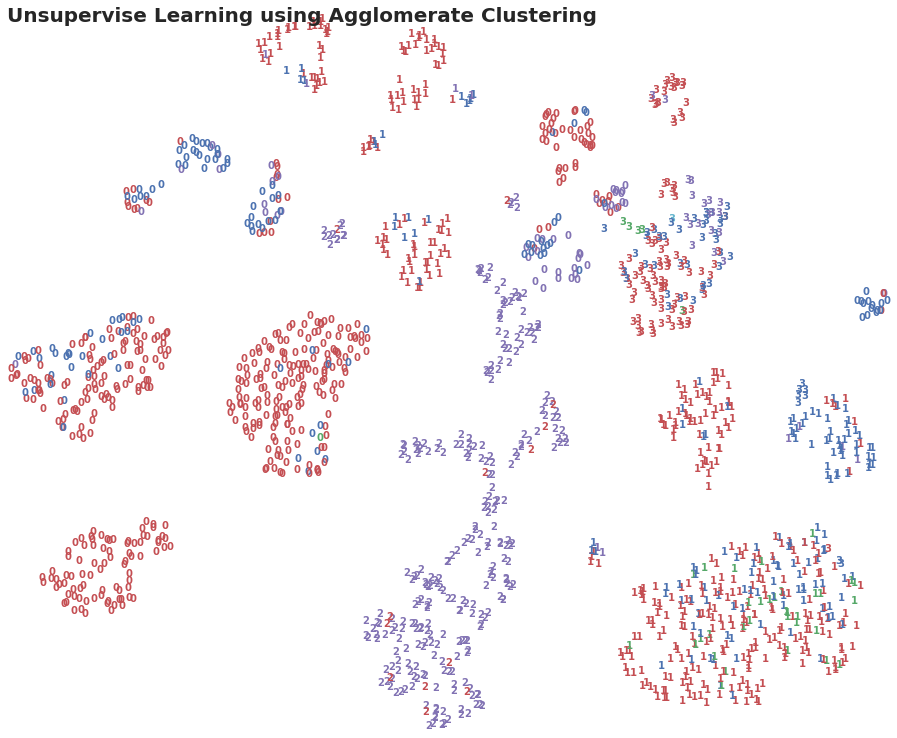

In [0]:
from sklearn.cluster import AgglomerativeClustering
y_pred = AgglomerativeClustering(linkage='ward', affinity='euclidean',n_clusters=4).fit_predict(X_std)
umap_plot(X_std,y.values-1,y_pred,'Unsupervise Learning using Agglomerate Clustering')

In [0]:
print ('\033[1m'+ "Agglomerate Clustering: Crosstab of Prediction versus Subfamily Label")
pd.crosstab(y, 1+y_pred) 

Agglomerate Clustering: Crosstab of Prediction versus Subfamily Label


col_0,1,2,3,4
PalmSubfamily_Tick,,,,
1.0,435,403,13,97
2.0,113,143,0,46
3.0,1,33,0,5
4.0,46,10,282,19
5.0,0,0,0,1


#3. DBSCAN Method

DBSCAN model was tested by varying two key parameters epsilon: search radius and min_samples: number of neighbouring datapoint within search radius. Epsilon values were varied from 1 to 6, the maximum possible limit for the dataset and min_sample were varied 1 to 30.

*   Maximum Silhouette Score: 0.6 for epsilon:6 (max limit, fails to model any clusters) 
*   ARI Score Y: 0.30 for epsilon: 3
*   ARI Score Z: 0.21 for epsilon: 2

In [0]:
from sklearn.cluster import DBSCAN

eps = np.arange(1,7,1)
y_dbscan_ari = []
z_dbscan_ari = []
for ind in eps:
  # Defining the agglomerative clustering with fixed min_sample = 5
  dbscan_cluster = DBSCAN(eps=ind, min_samples=5)
  y_pred = dbscan_cluster.fit_predict(X_std)
  y_dbscan_ari.append(metrics.adjusted_rand_score(y, y_pred))
  z_dbscan_ari.append(metrics.adjusted_rand_score(z, y_pred))

eps = np.arange(1,7,1)
dbscan_silh = []
for ind in eps:
  # Defining the agglomerative clustering with fixed min_sample = 5
  dbscan_cluster = DBSCAN(eps=ind, min_samples=5)
  y_pred = dbscan_cluster.fit_predict(X_std)
  dbscan_silh.append(metrics.silhouette_score(X_std, y_pred, metric='euclidean'))

In [0]:
# Hyperparameter Tuning using DBSCAN
eps = np.arange(1,7,1)
minpt = np.arange (1,31,1)
mat_ari = {}
mat_z_ari = {}
mat_silh = {}
mat_label = {}
cnt = 0
for j in minpt:
  temp_ari = []
  temp_z_ari = []
  temp_silh = []
  temp_label = []
  for i in eps: 
    # Defining the agglomerative clustering with fixed min_sample = 5
    dbscan_cluster = DBSCAN(eps=i, min_samples=j)
    y_pred = dbscan_cluster.fit_predict(X_std)
    temp_ari.append(metrics.adjusted_rand_score(y, y_pred))
    temp_z_ari.append(metrics.adjusted_rand_score(z, y_pred))
    temp_silh.append(metrics.silhouette_score(X_std, y_pred, metric='euclidean'))
    n_clusters_ = len(set(dbscan_cluster.labels_)) - (1 if -1 in dbscan_cluster.labels_ else 0)
    temp_label.append(n_clusters_)
  mat_ari.update({'min_dist_'+str(j):temp_ari})
  mat_z_ari.update({'min_dist_'+str(j):temp_z_ari})
  mat_silh.update({'min_dist_'+str(j):temp_silh})
  mat_label.update({'min_dist_'+str(j):temp_label})
  cnt += 1

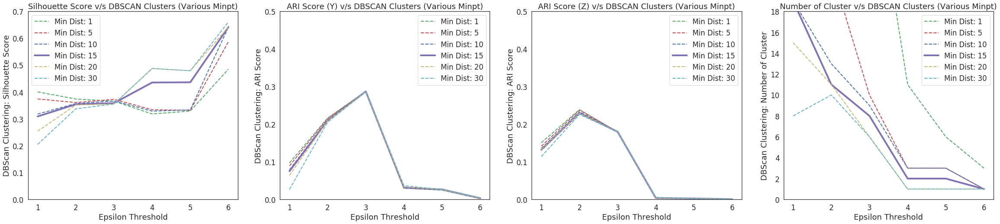

In [0]:
color_mat = 'grbmyc'
plt.figure(figsize=(40,8))
# Silhouette Score
plt.subplot(1, 4, 1)
plt.plot(eps,mat_silh.get('min_dist_1'),color=color_mat[0], linestyle='dashed',linewidth=2,label= 'Min Dist: 1')
plt.plot(eps,mat_silh.get('min_dist_5'),color=color_mat[1], linestyle='dashed',linewidth=2,label= 'Min Dist: 5')
plt.plot(eps,mat_silh.get('min_dist_10'),color=color_mat[2], linestyle='dashed',linewidth=2,label= 'Min Dist: 10')
plt.plot(eps,mat_silh.get('min_dist_15'),color=color_mat[3],linewidth=4,label= 'Min Dist: 15')
plt.plot(eps,mat_silh.get('min_dist_20'),color=color_mat[4], linestyle='dashed',linewidth=2,label= 'Min Dist: 20')
plt.plot(eps,mat_silh.get('min_dist_30'),color=color_mat[5], linestyle='dashed',linewidth=2,label= 'Min Dist: 30')
plt.xlabel("Epsilon Threshold")
plt.ylabel("DBScan Clustering: Silhouette Score")
plt.ylim(0,0.7)
plt.title("Silhouette Score v/s DBSCAN Clusters (Various Minpt)")
plt.legend()
# ARI Score: Y
plt.subplot(1, 4, 2)
plt.plot(eps,mat_ari.get('min_dist_1'),color=color_mat[0], linestyle='dashed',linewidth=2,label= 'Min Dist: 1')
plt.plot(eps,mat_ari.get('min_dist_5'),color=color_mat[1], linestyle='dashed',linewidth=2,label= 'Min Dist: 5')
plt.plot(eps,mat_ari.get('min_dist_10'),color=color_mat[2], linestyle='dashed',linewidth=2,label= 'Min Dist: 10')
plt.plot(eps,mat_ari.get('min_dist_15'),color=color_mat[3],linewidth=4,label= 'Min Dist: 15')
plt.plot(eps,mat_ari.get('min_dist_20'),color=color_mat[4], linestyle='dashed',linewidth=2,label= 'Min Dist: 20')
plt.plot(eps,mat_ari.get('min_dist_30'),color=color_mat[5], linestyle='dashed',linewidth=2,label= 'Min Dist: 30')
plt.xlabel("Epsilon Threshold")
plt.ylabel("DBScan Clustering: ARI Score")
plt.ylim(0,0.5)
plt.title("ARI Score (Y) v/s DBSCAN Clusters (Various Minpt)")
plt.legend()
# ARI Score: Z
plt.subplot(1, 4, 3)
plt.plot(eps,mat_z_ari.get('min_dist_1'),color=color_mat[0], linestyle='dashed',linewidth=2,label= 'Min Dist: 1')
plt.plot(eps,mat_z_ari.get('min_dist_5'),color=color_mat[1], linestyle='dashed',linewidth=2,label= 'Min Dist: 5')
plt.plot(eps,mat_z_ari.get('min_dist_10'),color=color_mat[2], linestyle='dashed',linewidth=2,label= 'Min Dist: 10')
plt.plot(eps,mat_z_ari.get('min_dist_15'),color=color_mat[3],linewidth=4,label= 'Min Dist: 15')
plt.plot(eps,mat_z_ari.get('min_dist_20'),color=color_mat[4], linestyle='dashed',linewidth=2,label= 'Min Dist: 20')
plt.plot(eps,mat_z_ari.get('min_dist_30'),color=color_mat[5], linestyle='dashed',linewidth=2,label= 'Min Dist: 30')
plt.xlabel("Epsilon Threshold")
plt.ylabel("DBScan Clustering: ARI Score")
plt.title("ARI Score (Z) v/s DBSCAN Clusters (Various Minpt)")
plt.ylim(0,0.5)
plt.legend()
# Number of clusters identified
plt.subplot(1, 4, 4)
plt.plot(eps,mat_label.get('min_dist_1'),color=color_mat[0], linestyle='dashed',linewidth=2,label= 'Min Dist: 1')
plt.plot(eps,mat_label.get('min_dist_5'),color=color_mat[1], linestyle='dashed',linewidth=2,label= 'Min Dist: 5')
plt.plot(eps,mat_label.get('min_dist_10'),color=color_mat[2], linestyle='dashed',linewidth=2,label= 'Min Dist: 10')
plt.plot(eps,mat_label.get('min_dist_15'),color=color_mat[3],linewidth=4,label= 'Min Dist: 15')
plt.plot(eps,mat_label.get('min_dist_20'),color=color_mat[4], linestyle='dashed',linewidth=2,label= 'Min Dist: 20')
plt.plot(eps,mat_label.get('min_dist_30'),color=color_mat[5], linestyle='dashed',linewidth=2,label= 'Min Dist: 30')
plt.xlabel("Epsilon Threshold")
plt.ylabel("DBScan Clustering: Number of Cluster")
plt.ylim(0,18)
plt.title("Number of Cluster v/s DBSCAN Clusters (Various Minpt)")
plt.legend()
plt.show()

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 9 separate connected components using meta-embedding (experimental)
  n_components


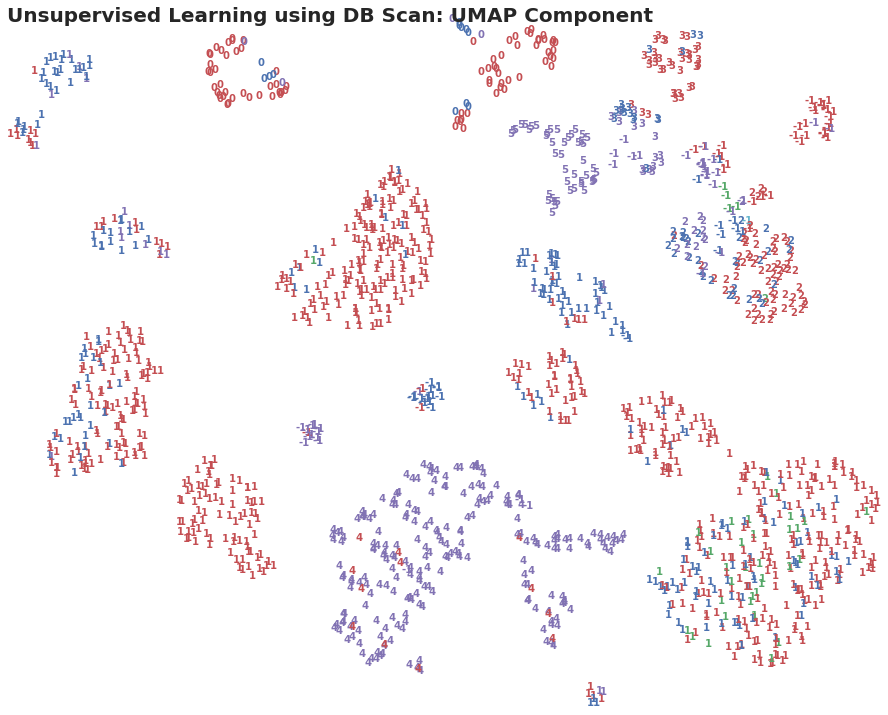

In [0]:
from sklearn.cluster import DBSCAN
dbscan_f = DBSCAN(eps=3, min_samples=30)
y_pred = dbscan_f.fit_predict(X_std)
umap_plot(X_std,y.values-1,y_pred,'Unsupervised Learning using DB Scan: UMAP Component')

In [0]:
print ('\033[1m'+ "DBSCAN: Crosstab of Prediction versus Subfamily Label")
pd.crosstab(y, 1+y_pred) 

DBSCAN: Crosstab of Prediction versus Subfamily Label


col_0,0,1,2,3,4,5,6,7,8,9,10
PalmSubfamily_Tick,,,,,,,,,,,
1.0,58,41,11,312,36,19,36,59,367,9,0
2.0,67,3,48,85,0,42,4,14,39,0,0
3.0,4,0,0,33,0,0,0,1,1,0,0
4.0,79,0,6,0,1,12,0,0,1,215,43
5.0,1,0,0,0,0,0,0,0,0,0,0


Epsilon:6 gives the highest silhouette scores but visually shows no clusters modelled

/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 9 separate connected components using meta-embedding (experimental)
  n_components


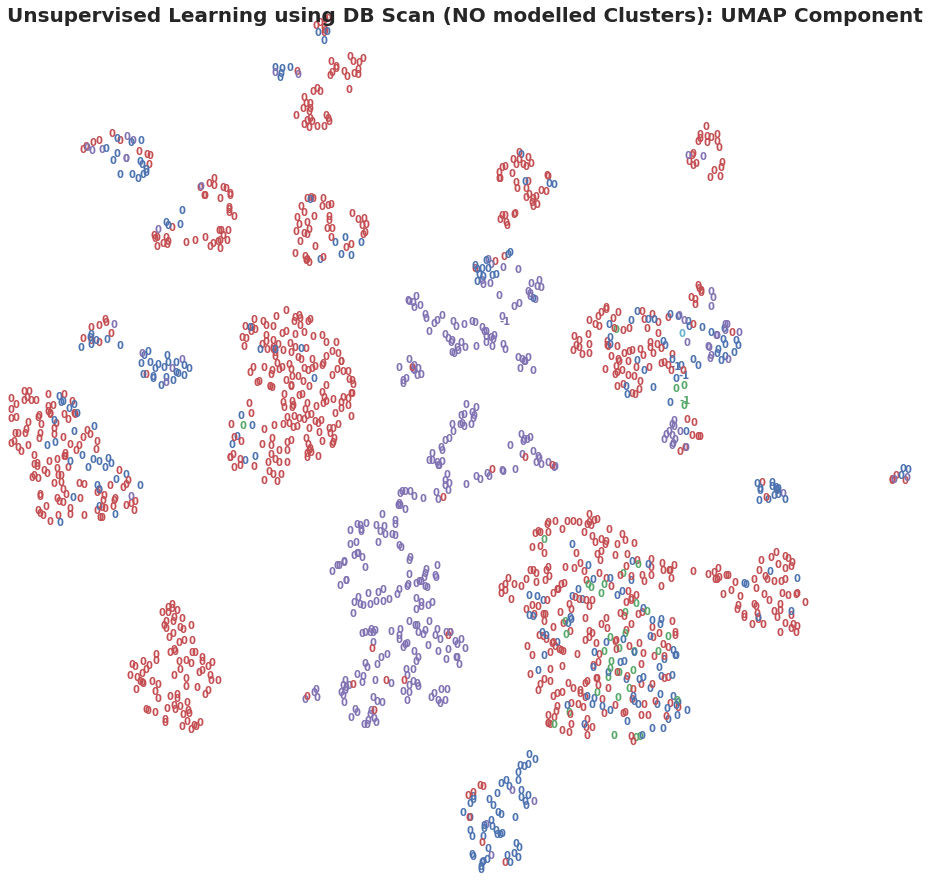

In [0]:
from sklearn.cluster import DBSCAN
dbscan_f = DBSCAN(eps=6, min_samples=30)
y_pred = dbscan_f.fit_predict(X_std)
umap_plot(X_std,y.values-1,y_pred,'Unsupervised Learning using DB Scan (NO modelled Clusters): UMAP Component')

#4. Gaussian Mixture Model Clustering

N_Cluster was varied from 2 to 10 and started with 50 random state initializations. 

*   Maximum Silhouette Score: 0.36 for n_cluster: 6
*   ARI Score Y: 0.23 for n_cluster: 3
*   ARI Score Z: 0.21 for n_cluster: 6

In [0]:
from sklearn.mixture import GaussianMixture
from sklearn import datasets, metrics

comp = np.arange (2,13,1)
gmm_ari = []
for ind in comp:
  # Defining the agglomerative clustering with fixed min_sample = 5
  gmm_cluster = GaussianMixture(n_components=ind, max_iter=500, random_state=123)
  # Fit model
  y_pred = gmm_cluster.fit_predict(X_std)
  print ("ARI score of GMM Clustering using ncomponent {} is {}".format(ind,metrics.adjusted_rand_score(y, y_pred)))
  gmm_ari.append(metrics.adjusted_rand_score(y, y_pred))

gmm_silh = []
for ind in comp:
  # Defining the agglomerative clustering with fixed min_sample = 5
  gmm_cluster = GaussianMixture(n_components=ind, max_iter=500, random_state=123)
  # Fit model
  y_pred = gmm_cluster.fit_predict(X_std)
  print ("silhouette score of GMM Clustering using ncomponent {} is {}".format(ind,metrics.silhouette_score(X_std, y_pred, metric='euclidean')))
  gmm_silh.append(metrics.silhouette_score(X_std, y_pred, metric='euclidean'))

ARI score of GMM Clustering using ncomponent 2 is 0.36933232129160404
ARI score of GMM Clustering using ncomponent 3 is 0.03858557266736587
ARI score of GMM Clustering using ncomponent 4 is 0.23104261432952072
ARI score of GMM Clustering using ncomponent 5 is 0.2330871460854515
ARI score of GMM Clustering using ncomponent 6 is 0.23308094416267539
ARI score of GMM Clustering using ncomponent 7 is 0.21137050241551963
ARI score of GMM Clustering using ncomponent 8 is 0.1585063686315762
ARI score of GMM Clustering using ncomponent 9 is 0.1403106835365944
ARI score of GMM Clustering using ncomponent 10 is 0.14128420454453458
ARI score of GMM Clustering using ncomponent 11 is 0.15879303139040848
ARI score of GMM Clustering using ncomponent 12 is 0.15668500001767846
silhouette score of GMM Clustering using ncomponent 2 is 0.30825729039536703
silhouette score of GMM Clustering using ncomponent 3 is 0.30610001671874676
silhouette score of GMM Clustering using ncomponent 4 is 0.36722589911533204

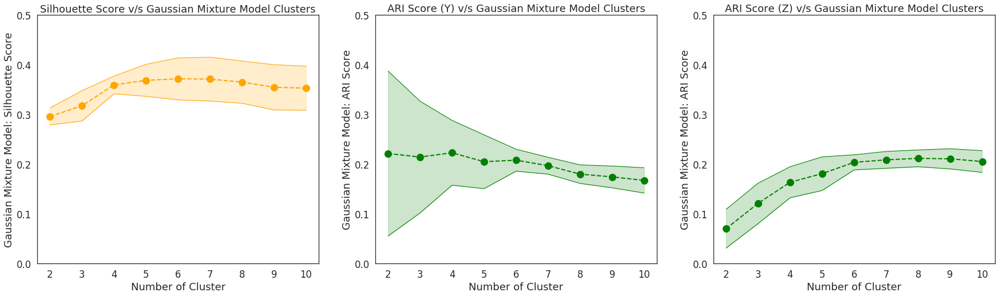

In [0]:
# Agglomerate ARI and Silhouette Score Database 
cluster_numbers = np.arange(2,11,1)
random_state = np.arange(1,51,1)
gmm_score_df = pd.DataFrame()
gmm_score_df['random_state'] = random_state
for j in random_state:
  for i in cluster_numbers:
      #k_means = KMeans(n_clusters=i, random_state=j)
      gmm_clust = GaussianMixture(n_components=i, random_state=j)
      full_pred = gmm_clust.fit_predict(X_std)
      gmm_score_df.loc[gmm_score_df['random_state'] == j,'y_ari_clus_'+str(i)]  = metrics.adjusted_rand_score(y, full_pred)
      gmm_score_df.loc[gmm_score_df['random_state'] == j,'z_ari_clus_'+str(i)]  = metrics.adjusted_rand_score(z, full_pred)
      gmm_score_df.loc[gmm_score_df['random_state'] == j,'silh_clus_'+str(i)] = metrics.silhouette_score(X_std, full_pred, metric='euclidean')

# Plotting the Elbow Graph
y_ari_col  = ['y_ari_clus_'+str(i) for i in cluster_numbers]
z_ari_col  = ['z_ari_clus_'+str(i) for i in cluster_numbers]
silh_col = ['silh_clus_'+str(i) for i in cluster_numbers]
# Plotting the Elbow Graph
score_plot(cluster_numbers,gmm_score_df[y_ari_col].mean(),gmm_score_df[y_ari_col].std(),gmm_score_df[z_ari_col].mean(),gmm_score_df[z_ari_col].std(),gmm_score_df[silh_col].mean(),gmm_score_df[silh_col].std(), 'Gaussian Mixture Model')

In [0]:
# GMM Modelling using different covariance type
mat=['full','tied','diag','spherical']
# Defining the agglomerative clustering
for val in mat:
  gmm_cluster = GaussianMixture(n_components=6, covariance_type = val, random_state=123)
  # Fit model
  clusters = gmm_cluster.fit_predict(X_std)

  print("Adjusted Rand Index of the GMM solution for {}: {}"
      .format(val,metrics.adjusted_rand_score(y, clusters)))
  print("The silhoutte score of the GMM solution for {}: {}"
      .format(val,metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the GMM solution for full: 0.23308094416267539
The silhoutte score of the GMM solution for full: 0.40292767895903925
Adjusted Rand Index of the GMM solution for tied: 0.2371434646736087
The silhoutte score of the GMM solution for tied: 0.403050880312908
Adjusted Rand Index of the GMM solution for diag: 0.23536978981373682
The silhoutte score of the GMM solution for diag: 0.4015584538190781
Adjusted Rand Index of the GMM solution for spherical: 0.16301443355282
The silhoutte score of the GMM solution for spherical: 0.316664499505923


/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 9 separate connected components using meta-embedding (experimental)
  n_components


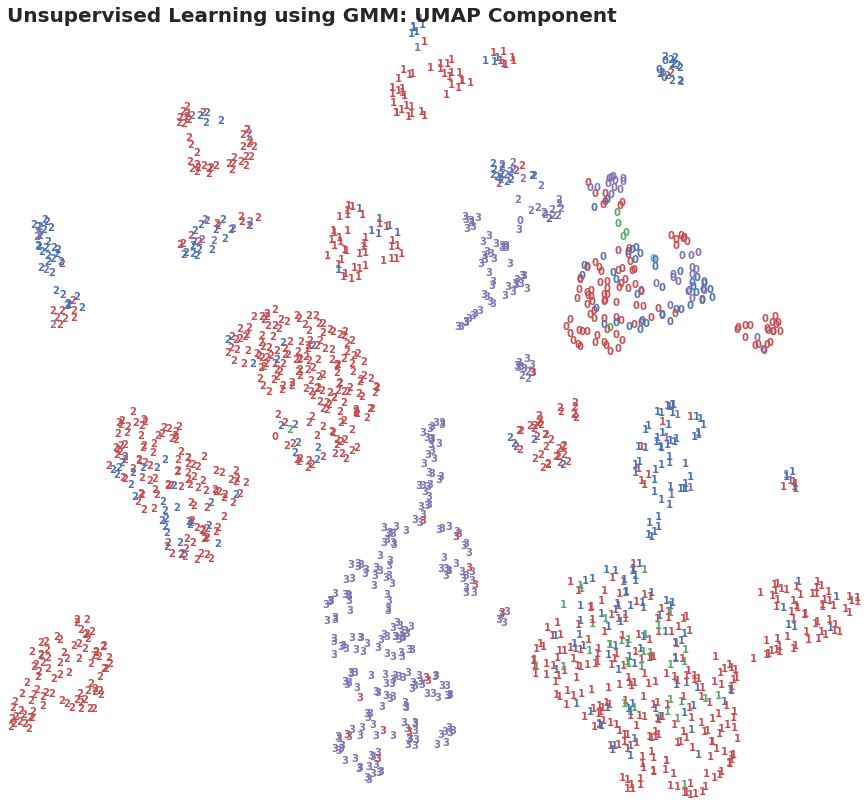

In [0]:
y_pred = GaussianMixture(n_components=4, random_state=123).fit_predict(X_std)
umap_plot(X_std,y.values-1,y_pred,'Unsupervised Learning using GMM: UMAP Component')

In [0]:
print ('\033[1m'+ "GMM: Crosstab of Prediction versus Subfamily Label")
pd.crosstab(y, 1+y_pred) 

GMM: Crosstab of Prediction versus Subfamily Label


col_0,0,1,2,3,4,5,6
PalmSubfamily_Tick,,,,,,,
1.0,34,80,711,72,39,12,0
2.0,24,12,218,31,17,0,0
3.0,4,0,34,1,0,0,0
4.0,38,4,19,13,15,222,46
5.0,1,0,0,0,0,0,0


In summary, the silhouette scores among the four tested models is somwhat similar at 0.4 to 0.6. The ARI score for subsfamily is between 0.20 to 0.25 and ARI score for Tribe is 0.20 to 0.21.

The corresponding ncluster for max silhouette score is some what similar between 6 to 8, 3 to 4 cluster for max ARI score (Y) and 6-8 for max ARI score (Z)

# Cluster Analysis: KMM versus AGL versus GMM

Different methods of prediction were used on the input feature. We compare the output of these methods. 

Datapoint population among predicted cluster are almost similar with subtle differences. For example, AGL custer 2 and 3 distribution are the same (589,595) against the KMM (557,681) and GMM (555,615).


In [0]:
# kMeans Result
palmtraits_fix_df["KMM_Result"] = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)
# Agglomerate Result
palmtraits_fix_df["AGL_Result"] = AgglomerativeClustering(linkage='ward', affinity='euclidean',n_clusters=4).fit_predict(X_std)
# GMM Result
palmtraits_fix_df["GMM_Result"] = GaussianMixture(n_components=4, random_state=123).fit_predict(X_std)

# Fixing order based on count
palmtraits_fix_df["KMM_Result"] = np.array([0 if x == 0 else 1 if x==3 else 2 if x==1 else 3 for x in palmtraits_fix_df["KMM_Result"]])
palmtraits_fix_df["AGL_Result"] = np.array([0 if x == 3 else 1 if x==2 else 2 if x==1 else 3 for x in palmtraits_fix_df["AGL_Result"]])
palmtraits_fix_df["GMM_Result"] = np.array([0 if x == 0 else 1 if x==3 else 2 if x==1 else 3 for x in palmtraits_fix_df["GMM_Result"]])

Text(0.5, 0.98, 'Cluster Distribution among various Methods ')

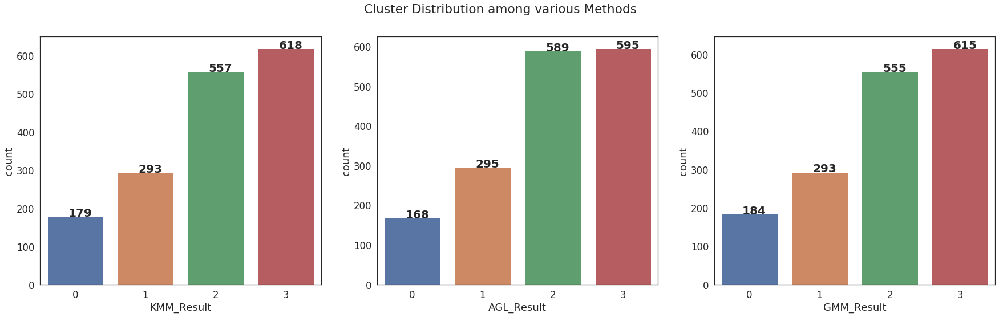

In [0]:
sns.set(style="white", font_scale=1.5)
plt.figure(figsize=(30,8))
plt.subplot(1, 3, 1)
sns.countplot(x="KMM_Result", data=palmtraits_fix_df)
cnt2 = 0
for val in palmtraits_fix_df["KMM_Result"].value_counts(): 
  plt.text(3-(0.1+cnt2*1), val, str(val),fontdict={'weight': 'bold', 'size': 20})
  cnt2 += 1
plt.subplot(1, 3, 2)
sns.countplot(x="AGL_Result", data=palmtraits_fix_df)
cnt2 = 0
for val in palmtraits_fix_df["AGL_Result"].value_counts(): 
  plt.text(3-(0.1+cnt2*1), val, str(val),fontdict={'weight': 'bold', 'size': 20})
  cnt2 += 1
plt.subplot(1, 3, 3)
sns.countplot(x="GMM_Result", data=palmtraits_fix_df)
cnt2 = 0
for val in palmtraits_fix_df["GMM_Result"].value_counts(): 
  plt.text(3-(0.1+cnt2*1), val, str(val),fontdict={'weight': 'bold', 'size': 20})
  cnt2 += 1
plt.suptitle("Cluster Distribution among various Methods ")

Mapping the Input features onto predicted clustering, the mean values and variances are also consistent. 

Minor differences are observed for binary and categorical features.

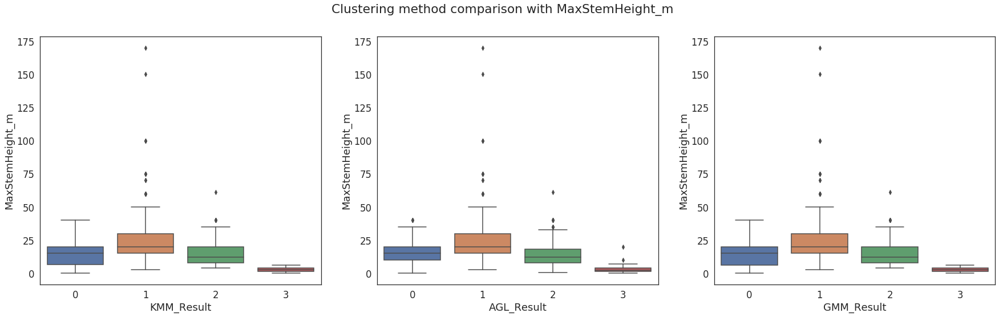

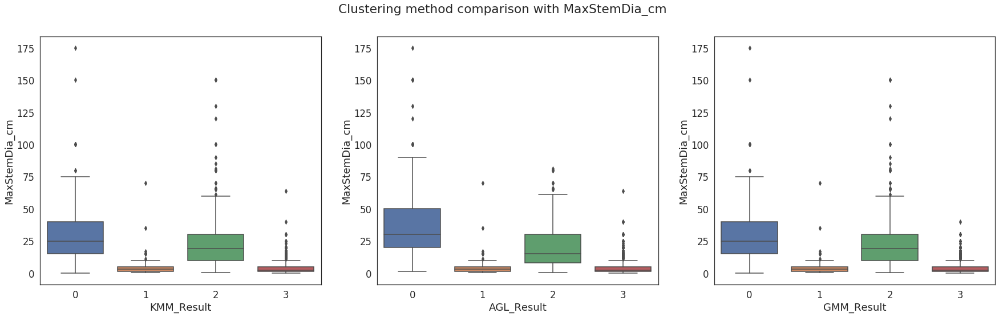

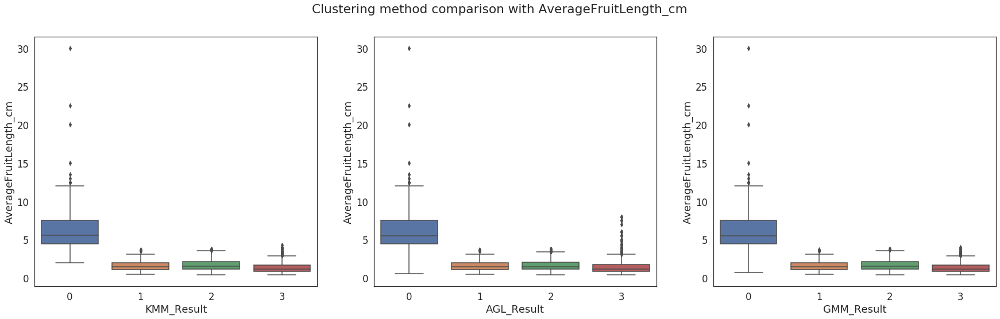

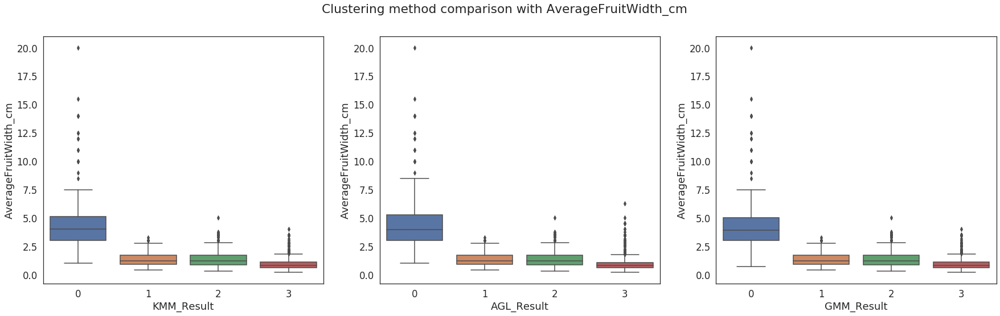

In [0]:
for col in cont_col:
  plt.figure(figsize=(30,8))
  plt.subplot(1, 3, 1)
  sns.boxplot(y=col, x="KMM_Result",data=palmtraits_fix_df)
  plt.subplot(1, 3, 2)
  sns.boxplot(y=col, x="AGL_Result",data=palmtraits_fix_df)
  plt.subplot(1, 3, 3)
  sns.boxplot(y=col, x="GMM_Result",data=palmtraits_fix_df)
  plt.suptitle("Clustering method comparison with "+col)
  plt.show()

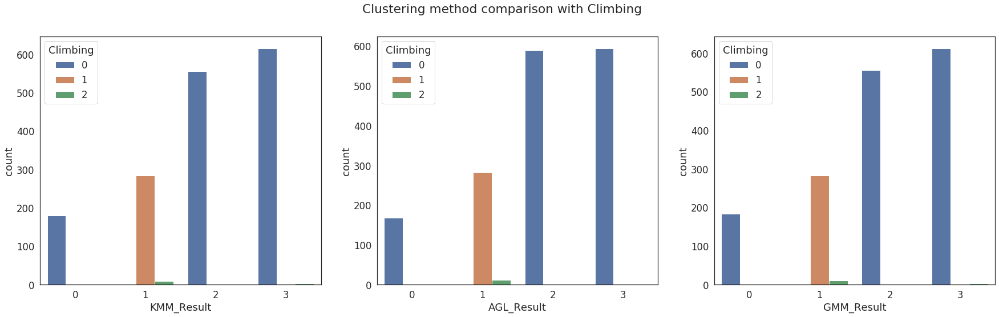

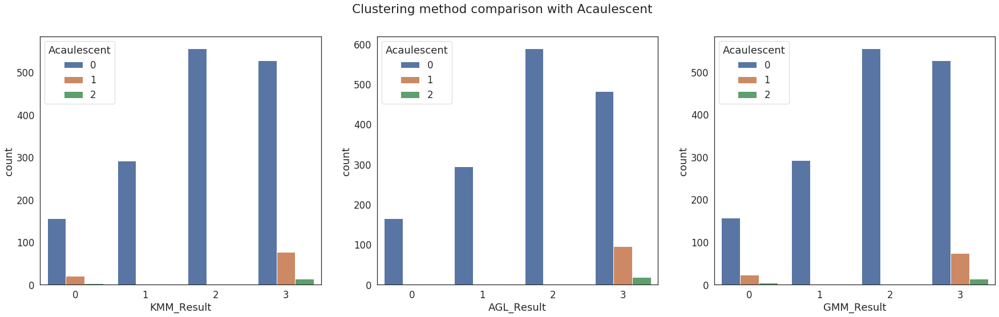

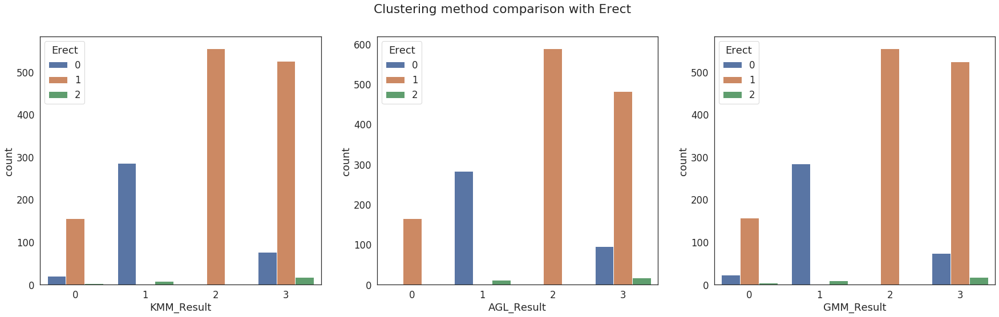

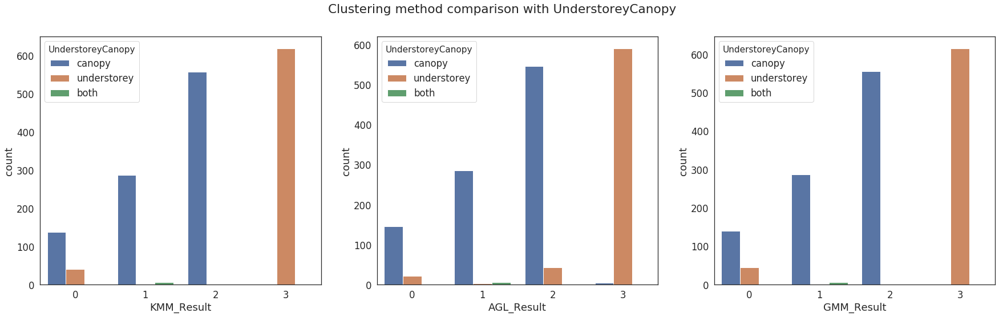

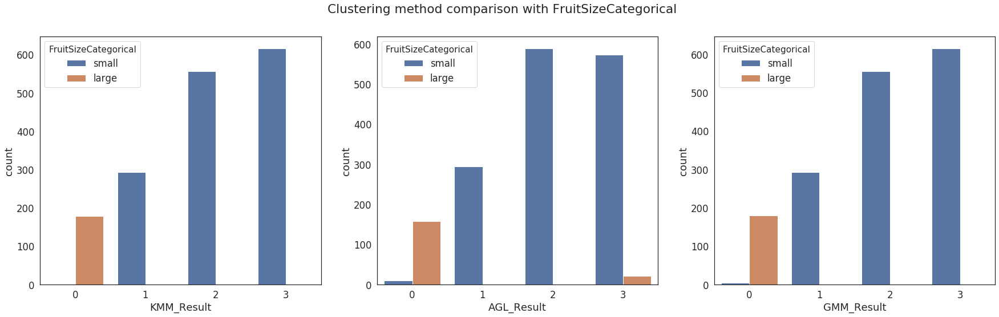

In [0]:
for col in binary_col[0:3]:
  plt.figure(figsize=(30,8))
  plt.subplot(1, 3, 1)
  sns.countplot(hue=col, x="KMM_Result",data=palmtraits_fix_df)
  plt.legend(loc=2,title=col)
  plt.subplot(1, 3, 2)
  sns.countplot(hue=col, x="AGL_Result",data=palmtraits_fix_df)
  plt.legend(loc=2,title=col)
  plt.subplot(1, 3, 3)
  sns.countplot(hue=col, x="GMM_Result",data=palmtraits_fix_df)
  plt.legend(loc=2,title=col)
  plt.suptitle("Clustering method comparison with "+col)
  plt.show()

for col in cat_col:
  plt.figure(figsize=(30,8))
  plt.subplot(1, 3, 1)
  sns.countplot(hue=col, x="KMM_Result",data=palmtraits_fix_df)
  plt.subplot(1, 3, 2)
  sns.countplot(hue=col, x="AGL_Result",data=palmtraits_fix_df)
  plt.subplot(1, 3, 3)
  sns.countplot(hue=col, x="GMM_Result",data=palmtraits_fix_df)
  plt.suptitle("Clustering method comparison with "+col)
  plt.show()

# Cluster Analysis: Palm Subfamily
Mapping the labels (palm subfamily) onto modelling results, the following observation are made:

*   Arecoideae Subfamily is predominant in Cluster 2 and 3
*   Calamoideae Subfamily is majorly present in Cluster 1
*   Arecoideae and Calamoideae Subfamily are linearly separable
*   Arecoideae and Coryphoideae Subfamily shows some inter-dependency or non linearlity (cluster 0,2,3). Hence the two can not be successfully separately using the input traits and modelling methods.



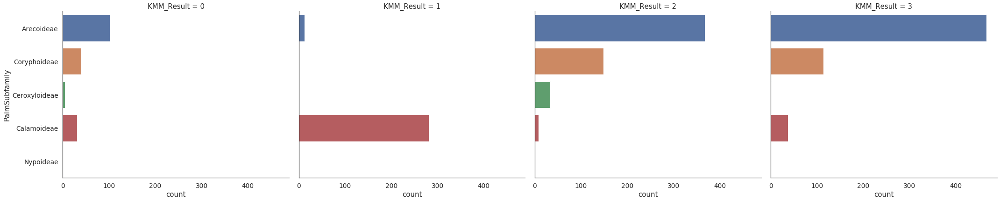

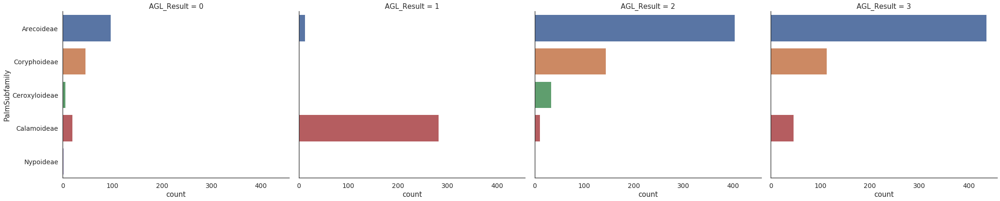

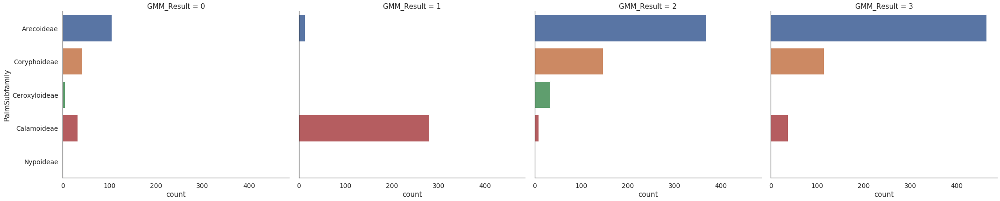

In [0]:
sns.set(style="white", font_scale=1.25)
sns.catplot(y = 'PalmSubfamily', col= 'KMM_Result', data=palmtraits_fix_df, kind="count",height=6, aspect=1.25)
sns.catplot(y = 'PalmSubfamily', col= 'AGL_Result', data=palmtraits_fix_df, kind="count",height=6, aspect=1.25)
sns.catplot(y = 'PalmSubfamily', col= 'GMM_Result', data=palmtraits_fix_df, kind="count",height=6, aspect=1.25)

# Summary of Unsupervised Learning


---
The unsupervised Machine learning flow on Palm Tree Species dataset is summarized as follows:

- The dataset was trimmed to removed the missing traits account for 65% of palm species. The input contains binary, continuous and categorical type features that were standardized for modelling.
- Taxonomy labels of Palm Subfamily and Palm Tribe were used to cross validate the clustering in the form of visualization QC and ARI score
- Dimensional Reduction analysis from t-SNE and UMAP shows more elaborate grouping of 6 to 10 clusters. PCA showed three linearly separable clusters.  UMAP dimensional reduction overall gave the best separation (visually) with tuned hyperparameters. 
- Four clustering techniques were used for modelling (K Means, Agglomerate, DBSCAN and GMM). The derived silhouette scores were in the range of 0.4 for clustering between 6 to 8. 
- In contrast, ARI score using Palm SubFamily were between 0.20 to 0.25 for ncluster 3 to 4.
- Cluster analysis on Palm Subfamily shows overall consistent distribution of datapoints. Arecoideae Subfamily is shown to be dominant in 2 cluster where as Calamoideae Subfamily is dominant in 1 cluster.
- Bivariate distribution for each predicted cluster is similar among the models.   
- **The predicted clusters and taxonomical grouping (Subfamily and Tribe) are not in agreement. This implies that datapoint sharing the same physical traits (fruit properties, stem, growth etc) could potentially originate from different Subfamily or Tribes. This information can be used to advantage in plantation planning or forest regeneration as certain region (or ecosystem or natural habitat) could support specific plant species to grow.**

# Possible Improvements to Modelling
To achieve better prediction results the following cases may be tested:
1. Log Transformation of continuous variables as our current distribution is highly asymmetric.
2. Run Modelling on reduced dimensionality components (PCA for example)
3. Addressing the missing values by data fill in using supervised learnings methods.